In [3]:
!pip install ipywidgets
!pip install pymupdf
!pip install python-docx

In [56]:
import os
os.environ["backend"] = "jax"

import tensorflow as tf

import jax.numpy as jnp
from jax import device_put

import keras_cv
import keras
from keras import ops
from keras import backend as K
from keras import layers, models, Model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import mixed_precision

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from scipy.signal import butter, filtfilt, welch, spectrogram
from scipy.stats import skew, kurtosis
from scipy.signal import butter, lfilter

from mne.preprocessing import ICA
from mne import create_info, EpochsArray
from mne.io import RawArray
from mne.channels import make_standard_montage

from docx import Document
from docx.shared import Inches
from io import BytesIO

import cv2
import pandas as pd
import numpy as np
import shutil
from glob import glob
from tqdm.notebook import tqdm
from joblib import Parallel, delayed
import pywt
import random
import math

import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
print("TensorFlow:", tf.__version__)
print("Keras:", keras.__version__)
print("KerasCV:", keras_cv.__version__)

TensorFlow: 2.17.1
Keras: 3.5.0
KerasCV: 0.9.0


<h1 style="color: #4CAF50; font-family: 'Arial', sans-serif; font-size: 28px; font-weight: bold; text-align: center;">
    🛠️ Data Preprocessing & Configuration Setup for Seizure Detection
</h1>
<p style="font-size: 18px; color: #555; text-align: center;">
    In this cell, we configure important settings, including random seed and batch size, and prepare the dataset for model training. We load the dataset, select one sample per EEG ID, and ensure the data is ready for further processing. 🔄📊
</p>

In [8]:
class CFG:
    verbose = 1  # Verbosity
    pandas_warning = None #Pandas Chained Assignment Warning Mode, default = 'warn'
    seed = 42  # Random seed
    batch_size = 32
    epochs = 20

pd.options.mode.chained_assignment = CFG.pandas_warning
keras.utils.set_random_seed(CFG.seed)

BASE_PATH = "/kaggle/input/hms-harmful-brain-activity-classification"
EEG_DIR = "/tmp/dataset/hms-hbac/numpy_eegs"
os.makedirs(EEG_DIR, exist_ok=True)

In [9]:
df = pd.read_csv(f'{BASE_PATH}/train.csv')
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106800 entries, 0 to 106799
Data columns (total 15 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   eeg_id                            106800 non-null  int64  
 1   eeg_sub_id                        106800 non-null  int64  
 2   eeg_label_offset_seconds          106800 non-null  float64
 3   spectrogram_id                    106800 non-null  int64  
 4   spectrogram_sub_id                106800 non-null  int64  
 5   spectrogram_label_offset_seconds  106800 non-null  float64
 6   label_id                          106800 non-null  int64  
 7   patient_id                        106800 non-null  int64  
 8   expert_consensus                  106800 non-null  object 
 9   seizure_vote                      106800 non-null  int64  
 10  lpd_vote                          106800 non-null  int64  
 11  gpd_vote                          106800 non-null  i

None

In [10]:
# As each file points to only one EEG ID, we will select only 1 sample from metadata.
df = df.groupby("eeg_id").head(1).reset_index(drop=True)
df.head(5)

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,2277392603,0,0.0,924234,0,0.0,1978807404,30539,GPD,0,0,5,0,1,5
2,722738444,0,0.0,999431,0,0.0,557980729,56885,LRDA,0,1,0,14,0,1
3,387987538,0,0.0,1084844,0,0.0,4099147263,4264,LRDA,0,0,0,3,0,0
4,2175806584,0,0.0,1219001,0,0.0,1963161945,23435,Seizure,3,0,0,0,0,0


<h1 style="color: #FF5722; font-family: 'Arial', sans-serif; font-size: 28px; font-weight: bold; text-align: center;">
    ⚖️ Class Labeling & Data Balancing for Seizure Detection
</h1>
<p style="font-size: 18px; color: #555; text-align: center;">
    This cell focuses on assigning binary labels for seizure detection, splitting the dataset into seizure and non-seizure classes, and balancing the data through undersampling. We ensure a 1:1 class distribution for training the model. 📊🤖
</p>

In [11]:
# As we are working on only seizure / non-seizure classification, we will not use default class labels of the dataset.
df['is_seizure'] = df['expert_consensus'] == 'Seizure'

# Train + Valid + Test (We will use train_test_split to split the data)
df['eeg_path'] = f'{BASE_PATH}/train_eegs/'+df['eeg_id'].astype(str)+'.parquet'
# df['eeg2_path'] = f'{EEG_DIR}/'+df['eeg_id'].astype(str)+'.npy'
df['spec_path'] = f'{BASE_PATH}/train_spectrograms/'+df['spectrogram_id'].astype(str)+'.parquet'

display(df.head(2))
print(f"Total Data: {len(df)}")


,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,is_seizure,eeg_path,spec_path
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0,True,/kaggle/input/hms-harmful-brain-activity-class...,/kaggle/input/hms-harmful-brain-activity-class...
1,2277392603,0,0.0,924234,0,0.0,1978807404,30539,GPD,0,0,5,0,1,5,False,/kaggle/input/hms-harmful-brain-activity-class...,/kaggle/input/hms-harmful-brain-activity-class...


Total Data: 17089


expert_consensus
Seizure    2785
Other      1399
LPD         504
GPD         364
GRDA        344
LRDA        174
Name: count, dtype: int64

<Axes: title={'center': 'Class Distribution'}, xlabel='expert_consensus'>

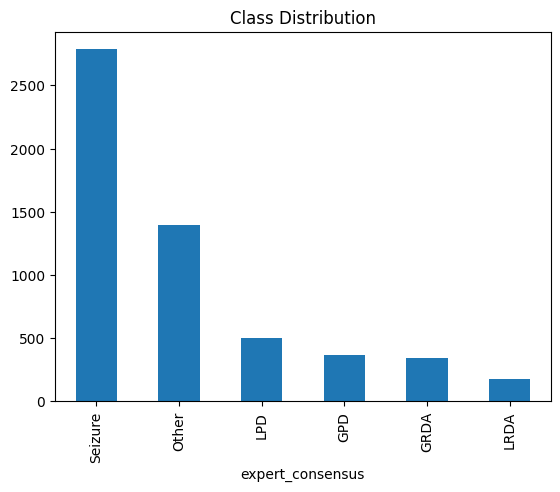

In [12]:
# Filter for 'Seizure' class and a subset of 'non-Seizure' classes
seizure_df = df[df['expert_consensus'] == 'Seizure']
non_seizure_df = df[df['expert_consensus'] != 'Seizure']

# Undersample non-Seizure data (e.g., 1:1 ratio)
non_seizure_sampled = non_seizure_df.sample(n=len(seizure_df), random_state=CFG.seed)

# Combine and shuffle the new dataset
df = pd.concat([seizure_df, non_seizure_sampled]).sample(frac=1, random_state=CFG.seed)
df.sort_values(by=["eeg_id", "eeg_label_offset_seconds"], ignore_index=True, inplace=True)

class_counts = df['expert_consensus'].value_counts()
display(class_counts)
class_counts.plot(kind='bar', title='Class Distribution')

<h1 style="color: #2196F3; font-family: 'Arial', sans-serif; font-size: 28px; font-weight: bold; text-align: center;">
    📊 Inspecting Data Samples: EEG & Spectrogram Files
</h1>
<p style="font-size: 18px; color: #555; text-align: center;">
    In this cell, we randomly sample EEG and spectrogram files from the dataset to inspect their shapes, feature ranges, and overall characteristics. This helps us understand the structure and distribution of the data before model training. 🔍💡
</p>

In [13]:
random_samples = np.random.randint(0, len(df) - 1, size=(10))
for i in random_samples:
    reading_spec = pd.read_parquet(f"{BASE_PATH}/train_spectrograms/{df['spectrogram_id'].iloc[i]}.parquet")
    reading_eeg = pd.read_parquet(f"{BASE_PATH}/train_eegs/{df['eeg_id'].iloc[i]}.parquet")
    print(f"Rows in EEG File: {reading_eeg.shape[0]}\t Rows in Spectrogram File: {reading_spec.shape[0]}")

Rows in EEG File: 24400	 Rows in Spectrogram File: 4089
Rows in EEG File: 12800	 Rows in Spectrogram File: 307
Rows in EEG File: 15200	 Rows in Spectrogram File: 313
Rows in EEG File: 42800	 Rows in Spectrogram File: 382
Rows in EEG File: 12800	 Rows in Spectrogram File: 307
Rows in EEG File: 31600	 Rows in Spectrogram File: 974
Rows in EEG File: 29600	 Rows in Spectrogram File: 974
Rows in EEG File: 15600	 Rows in Spectrogram File: 314
Rows in EEG File: 22800	 Rows in Spectrogram File: 579
Rows in EEG File: 22400	 Rows in Spectrogram File: 331


In [18]:
# Information regarding a single spectrogram
train_df_samples = len(df) # There are total 106800 training samples
print(f"Total Samples: {train_df_samples}")

random_index = np.random.randint(0, train_df_samples - 1)

random_spec_id = df['spectrogram_id'].iloc[random_index]
reading_spec = pd.read_parquet(f"{BASE_PATH}/train_spectrograms/{random_spec_id}.parquet")
random_eeg_id = df['eeg_id'].iloc[random_index]
reading_eeg = pd.read_parquet(f"{BASE_PATH}/train_eegs/{random_eeg_id}.parquet")

print("\nSPECTROGRAM INFORMATION:")
print(f"Shape of spectrogram: {reading_spec.shape}")
print(f"Spectrogram data min: {reading_spec.iloc[:, 1:].values.min()}")
print(f"Spectrogram data max: {reading_spec.iloc[:, 1:].values.max()}")
print(f"Spectrogram data mean: {reading_spec.iloc[:, 1:].values.mean()}")
print("Features of Spectrogram:\n")
display(reading_spec.columns)

print("\nEEG INFORMATION:")
print(f"Shape of EEG: {reading_eeg.shape}")
print(f"EEG data min: {reading_eeg.iloc[:, :-1].values.min()}")
print(f"EEG data max: {reading_eeg.iloc[:, :-1].values.max()}")
print(f"EEG data mean: {reading_eeg.iloc[:, :-1].values.mean()}")
print("Features of Spectrogram:\n")
display(reading_eeg.columns)

Total Samples: 5570

SPECTROGRAM INFORMATION:
Shape of spectrogram: (685, 401)
Spectrogram data min: 0.009999999776482582
Spectrogram data max: 553.8400268554688
Spectrogram data mean: 3.870969772338867
Features of Spectrogram:



Index(['time', 'LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37',
       'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15',
       ...
       'RP_18.16', 'RP_18.36', 'RP_18.55', 'RP_18.75', 'RP_18.95', 'RP_19.14',
       'RP_19.34', 'RP_19.53', 'RP_19.73', 'RP_19.92'],
      dtype='object', length=401)


EEG INFORMATION:
Shape of EEG: (13200, 20)
EEG data min: -150.1199951171875
EEG data max: 126.41000366210938
EEG data mean: -7.812317371368408
Features of Spectrogram:



Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG'],
      dtype='object')

<h1 style="color: #4CAF50; font-family: 'Arial', sans-serif; font-size: 32px; font-weight: bold; text-align: center;">
    📂 <span style="color: #FF5722;">Preview of Example Figures</span> in Seizure Detection Dataset 📑
</h1>
<p style="font-size: 18px; color: #555; text-align: center;">
    In this cell, we are showcasing <span style="font-weight: bold; color: #2196F3;">example figures</span> that represent how the dataset for our <span style="color: #009688;">Seizure Detection Model</span> might look. Before diving into the actual dataset, we're giving you a preview of the types of figures and data visualizations you'll encounter in the real dataset. 🧠💡
</p>

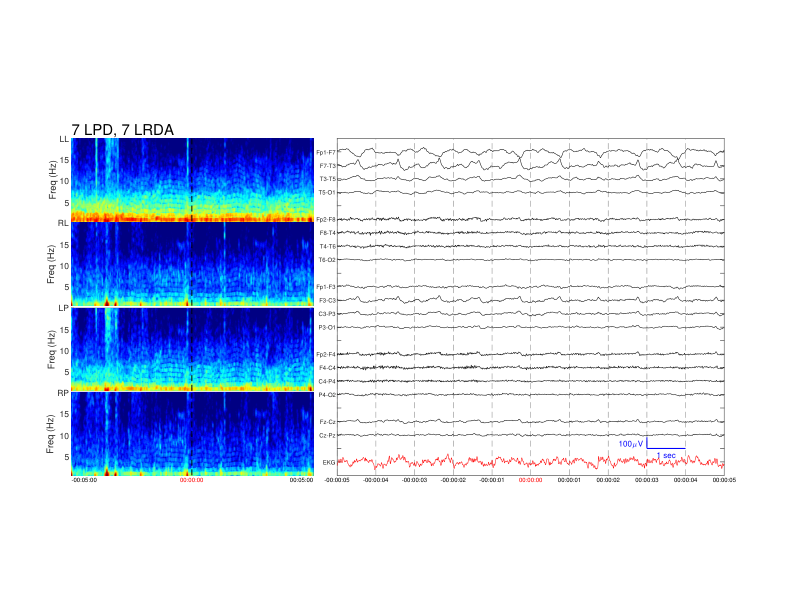

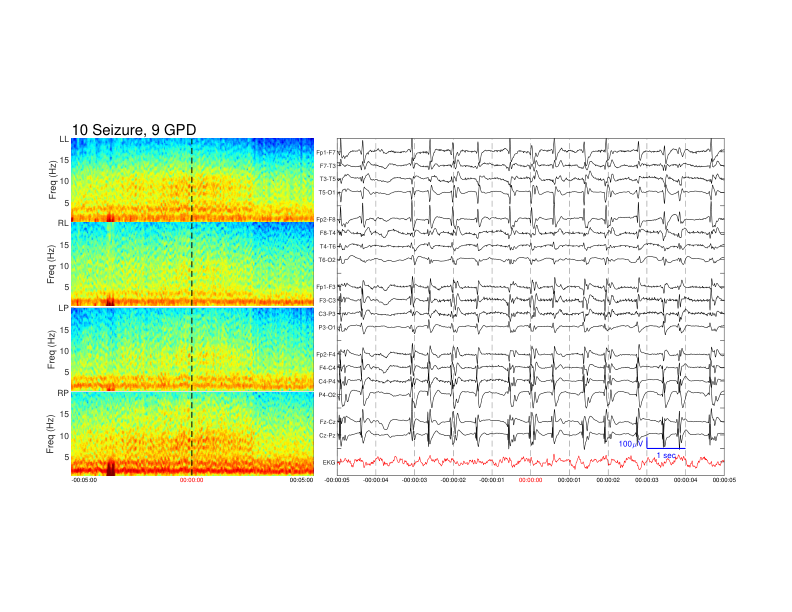

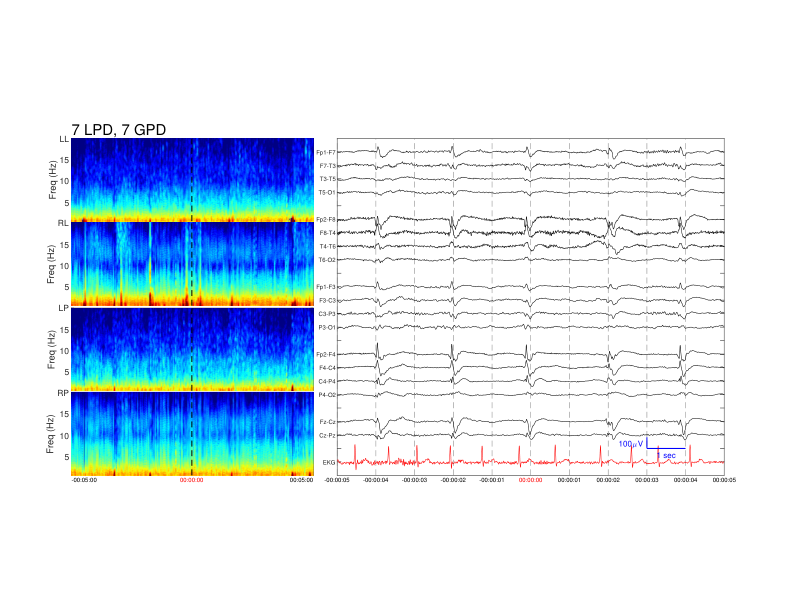

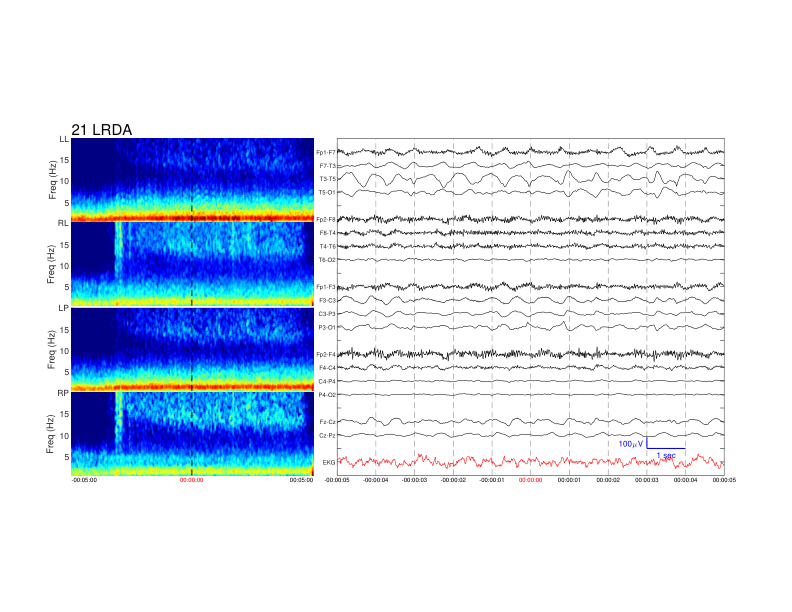

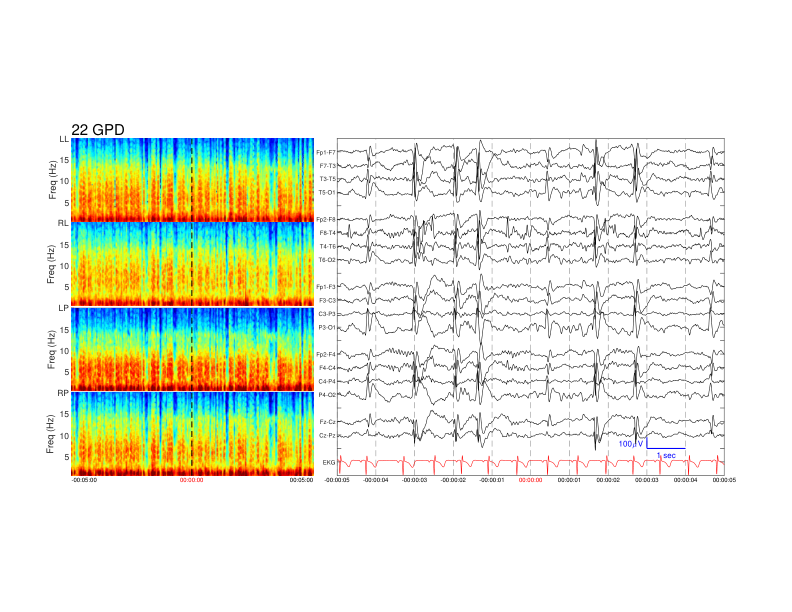

...

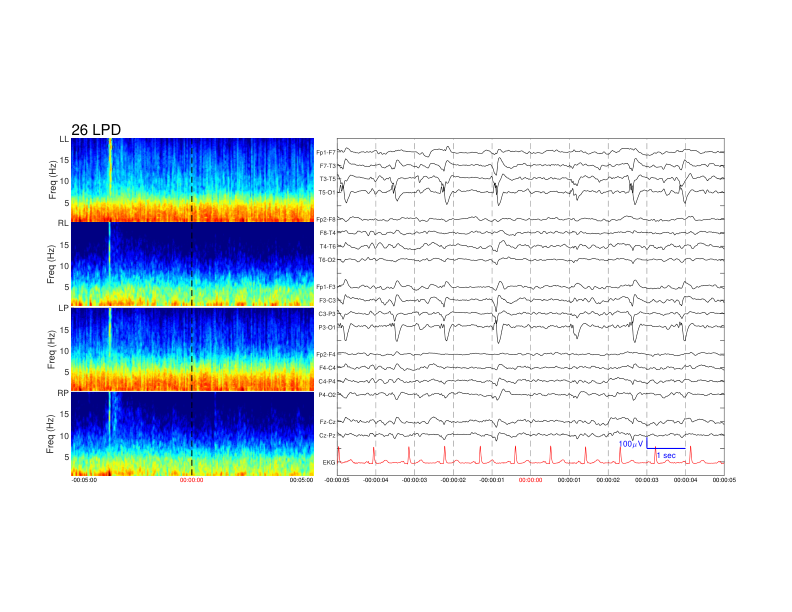

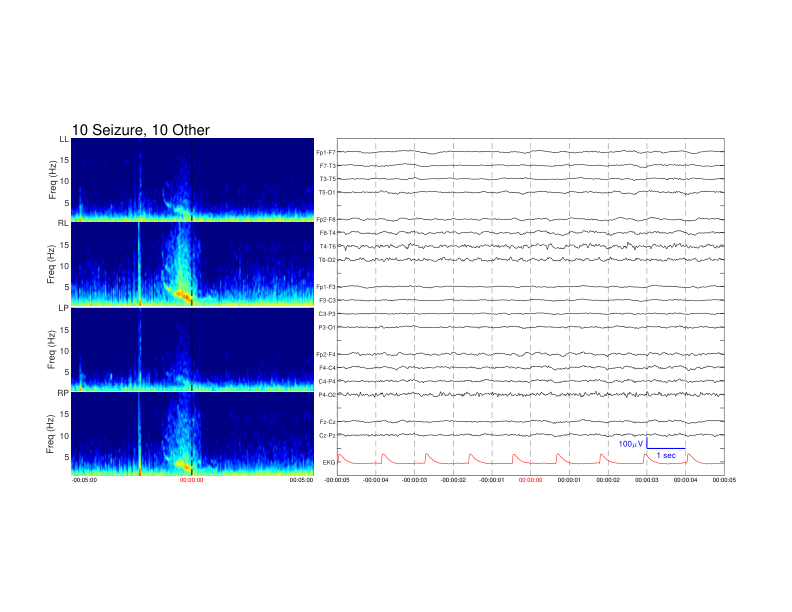

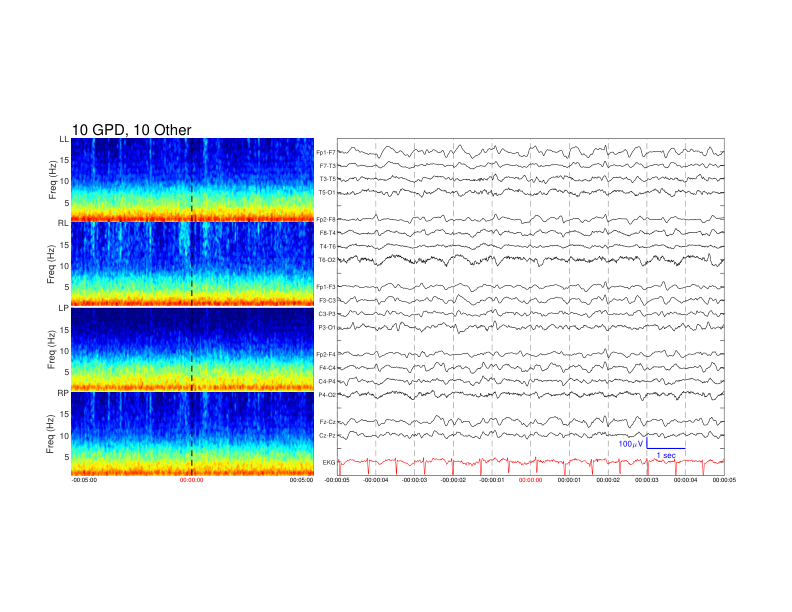

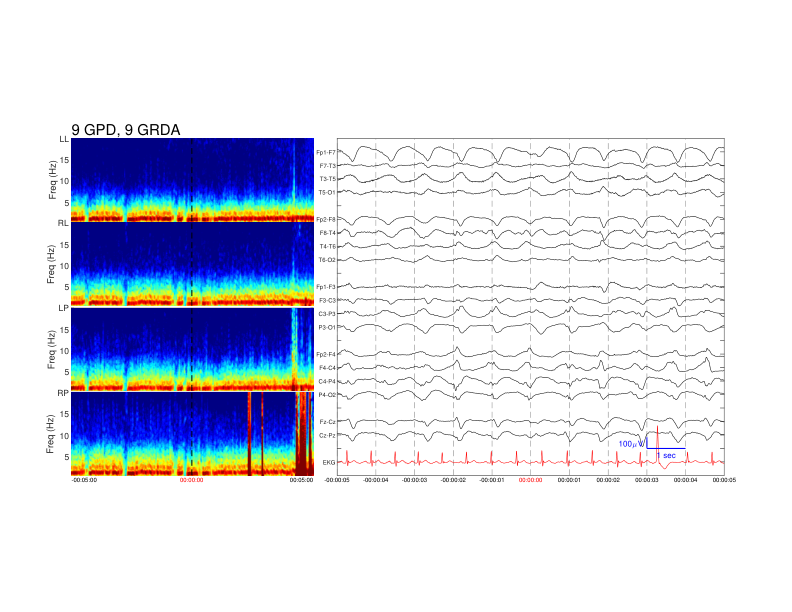

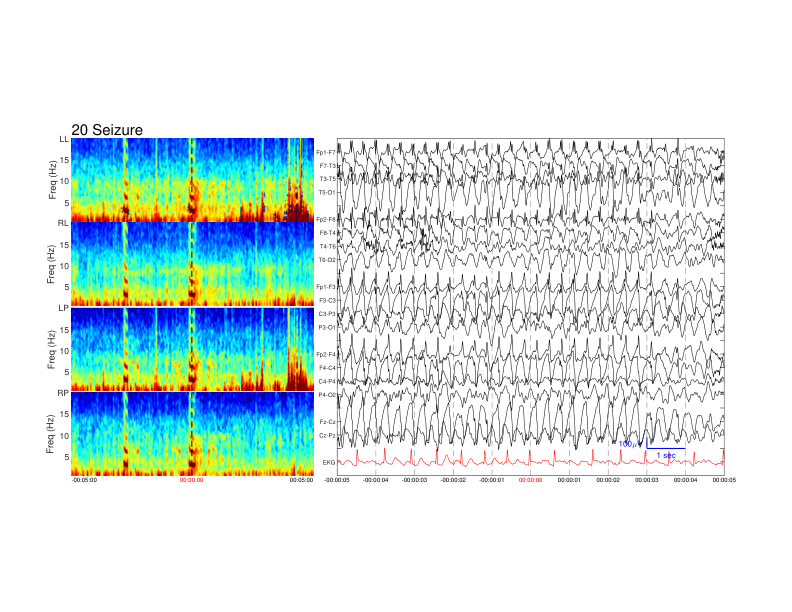

In [118]:
import fitz  # PyMuPDF
from PIL import Image
from io import BytesIO

# Folder containing the PDF files
folder_path = f"{BASE_PATH}/example_figures"

# List all files in the folder
pdf_files = [f for f in os.listdir(folder_path) if f.endswith('.pdf')]

# Loop through all PDF files and display them
for pdf_file in pdf_files:
    # Construct the full path of the PDF file
    pdf_path = os.path.join(folder_path, pdf_file)
    
    # Open the PDF file
    doc = fitz.open(pdf_path)
    
    # Loop through the pages and display each one
    for page_num in range(doc.page_count):
        page = doc.load_page(page_num)  # Load the page
        pix = page.get_pixmap()  # Convert page to a pixmap (image)

        # Convert to a PIL Image
        img = Image.open(BytesIO(pix.tobytes("png")))

        # Display the image in the notebook
        display(img)


<h1 style="color: #FF9800; font-family: 'Arial', sans-serif; font-size: 28px; font-weight: bold; text-align: center;">
    🔍 Data Integrity & Signal Quality Check for Spectrograms
</h1>
<p style="font-size: 18px; color: #555; text-align: center;">
    In this cell, we verify the consistency of spectrogram time data, check the quality of signals over time, and visualize the spectrogram to ensure the data is clean and ready for model training. 📊🎶
</p>


Signal Quality Check:
  Time gaps are consistent.
  All frequency bands have sufficient variance.
Spectrogram data min: 0.009999999776482582
Spectrogram data max: 15110536.0
Spectrogram data mean: 5123.552734375


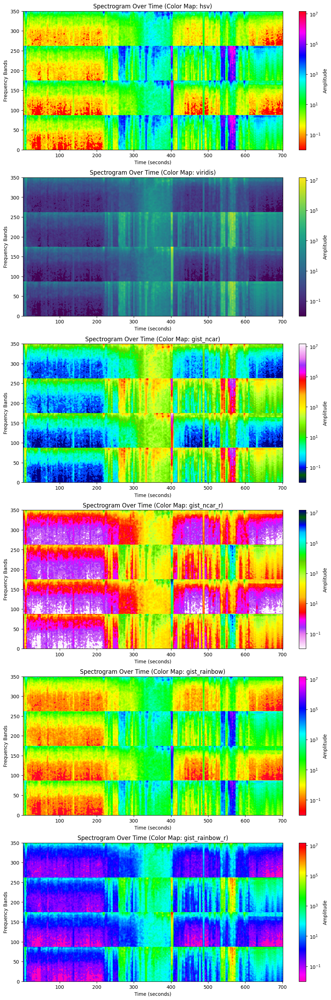

In [16]:
reading_spec = pd.read_parquet(f"{BASE_PATH}/train_spectrograms/{df['spectrogram_id'].iloc[np.random.randint(0, train_df_samples - 1)]}.parquet")

# Step 1: Verify time consistency
def check_time_consistency(spectrogram_data, metadata, spectrogram_id):
    """
    Verify if the 'time' column in the spectrogram data matches the metadata offsets.
    """
    sub_metadata = metadata[metadata["spectrogram_id"] == spectrogram_id]
    metadata_times = sub_metadata["spectrogram_label_offset_seconds"].values
    data_times = spectrogram_data["time"].values

    # Check for missing or mismatched times
    missing_times = set(metadata_times) - set(data_times)
    extra_times = set(data_times) - set(metadata_times)

    print("Time Consistency Check:")
    if missing_times:
        print(f"  Missing time points in spectrogram data: {missing_times}")
    if extra_times:
        print(f"  Extra time points in spectrogram data: {extra_times}")
    if not missing_times and not extra_times:
        print("  All time points match!")
    return missing_times, extra_times

# missing_times, extra_times = check_time_consistency(reading_spec, train_df, random_id)

# Step 2: Check for signal quality across time
def check_signal_quality(df, min_variance=1e-5):
    """
    Analyze the signal quality over time for anomalies or low variance.
    """
    print("\nSignal Quality Check:")
    time_series = df["time"].diff().dropna()

    # Check for irregular time gaps
    if time_series.std() > 0.1:  # Adjust threshold as needed
        print(f"  Irregular time gaps detected! Std Dev: {time_series.std()}")
    else:
        print("  Time gaps are consistent.")

    # Check variance in frequency bands over time
    variances = df.iloc[:, 1:].var(axis=0)  # Exclude 'time' column
    low_variance_cols = variances[variances < min_variance]
    if not low_variance_cols.empty:
        print(f"  Low variance detected in columns: {low_variance_cols.index.tolist()}")
    else:
        print("  All frequency bands have sufficient variance.")

check_signal_quality(reading_spec)
    
import matplotlib.colors as colors

# Step 3: Visualize time-based trends
def plot_spectrogram_over_time(df):
    """
    Plot the spectrogram over time to visually inspect for noise or artifacts.
    """

    # Extract time and spectrogram data
    time = df["time"].values
    spectrogram_data = df.iloc[:, 1:].values  # Excluding the time column

    # Check the min, max, and mean values to understand the scale
    spec_min = spectrogram_data.min()
    spec_max = spectrogram_data.max()
    print(f"Spectrogram data min: {spec_min}")
    print(f"Spectrogram data max: {spec_max}")
    print(f"Spectrogram data mean: {spectrogram_data.mean()}")

    colormaps = ['hsv', "viridis", 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r']
    plt.figure(figsize=(12, len(colormaps) * 6))
    for i, cm in enumerate(colormaps):
        plt.subplot(len(colormaps), 1, i + 1)
        plt.imshow(spectrogram_data.T, aspect="auto", cmap=cm,
                   norm=colors.LogNorm(),
                   extent=[time.min(), time.max(), 0, spectrogram_data.shape[0] - 1])
        plt.colorbar(label="Amplitude")
        plt.xlabel("Time (seconds)")
        plt.ylabel("Frequency Bands")
        plt.title(f"Spectrogram Over Time (Color Map: {cm})")
    plt.show()

plot_spectrogram_over_time(reading_spec)

<h1 style="color: #009688; font-family: 'Arial', sans-serif; font-size: 28px; font-weight: bold; text-align: center;">
    🔧 EEG Signal Quality Analysis & Filtering
</h1>
<p style="font-size: 18px; color: #555; text-align: center;">
    This cell performs a detailed analysis of EEG signal quality, including variance checks, frequency band power calculation, correlation between electrodes, and filtering of noisy signals. We aim to enhance the quality of the data for effective seizure detection. 🧠⚡
</p>

In [15]:
# Bandpass filter function (to remove noise outside 0.5-50 Hz range)
def bandpass_filter(data, lowcut=0.5, highcut=50, fs=200, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype="band")
    return filtfilt(b, a, data, axis=0)

Power for Fp1: {'delta': 35195964.0, 'theta': 19919724.0, 'alpha': 27040056.0, 'beta': 112044184.0, 'gamma': 97778696.0, 'high_freq_noise': 150148450.0}
Power for F3: {'delta': 36973576.0, 'theta': 16434488.0, 'alpha': 23702342.0, 'beta': 109695490.0, 'gamma': 97544140.0, 'high_freq_noise': 145160220.0}
Power for C3: {'delta': 575888260.0, 'theta': 172988670.0, 'alpha': 125769816.0, 'beta': 249702200.0, 'gamma': 173958720.0, 'high_freq_noise': 262625420.0}


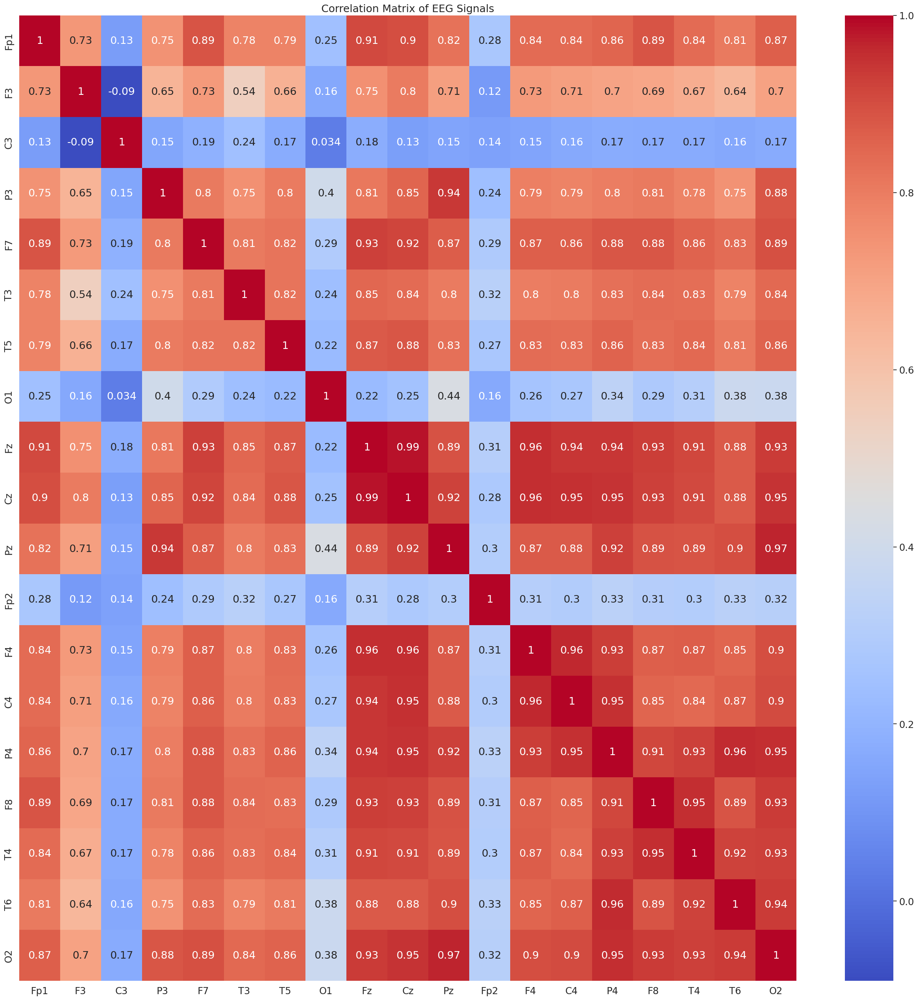

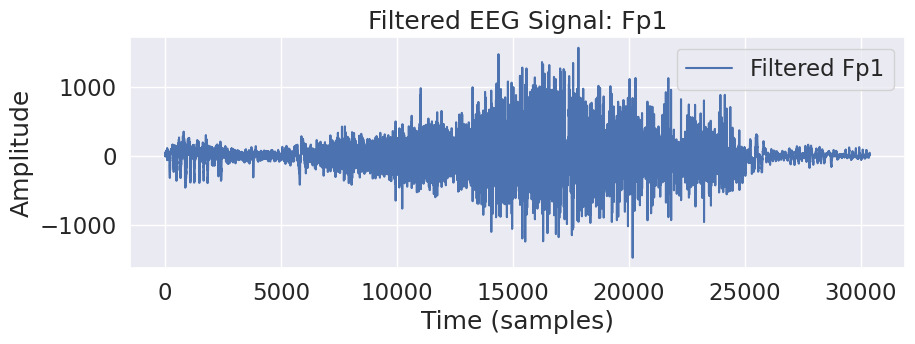

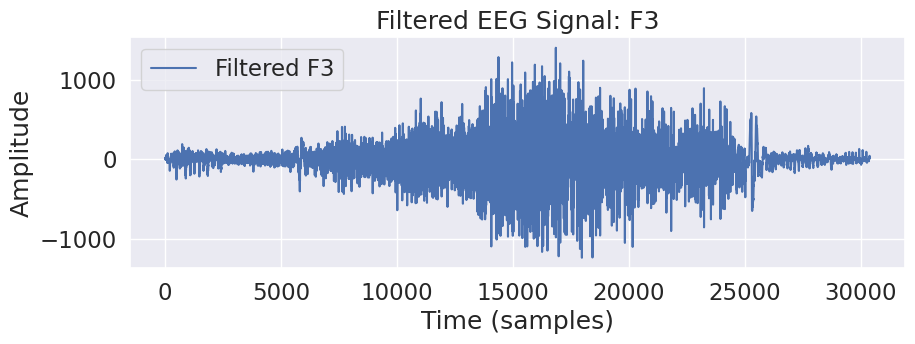

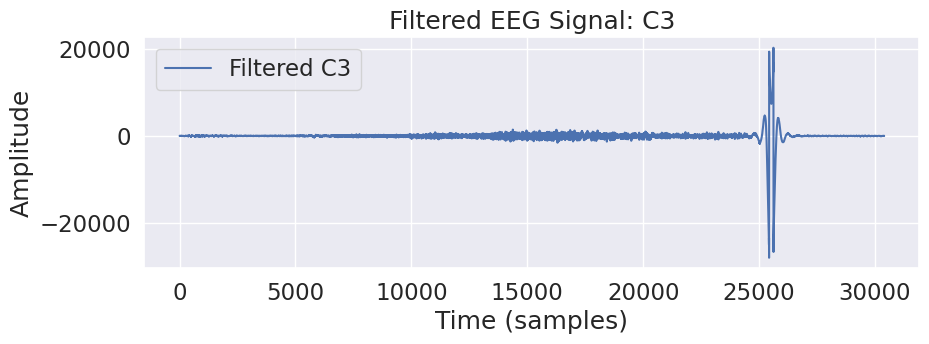


=== EEG Signal Noise Analysis Summary ===
Mean Variance: 629222.8125
High Variance Threshold: 4249286.3125
Low Variance Threshold: -2990840.6875
Electrodes with High Variance:
C3    8027621.5
dtype: float32
Electrodes with Low Variance:
Series([], dtype: float32)
Electrodes with High Variance:
C3    8027621.5
dtype: float32
Electrodes with Low Variance:
Series([], dtype: float32)
Electrodes with High-Frequency Noise:
  Fp1
  F3
  P3
  F7
  T3
  T5
  O1
  Fz
  Cz
  Pz
  Fp2
  F4
  C4
  P4
  F8
  T4
  T6
  O2

Highly Correlated Electrodes (likely redundant):
Fz     9
Cz    10
P4     9
T4     6
O2     9
dtype: int64


In [20]:
# Load a sample EEG file (update with actual file paths)
reading_eeg = pd.read_parquet(f"{BASE_PATH}/train_eegs/{df['eeg_id'].iloc[np.random.randint(0, train_df_samples - 1)]}.parquet")
eeg_data = reading_eeg.drop(columns=["EKG"])

# Sampling frequency (Hz)
FS = 200

# Analysis Results Dictionary
results = {}

### 1. Check Signal Variance
variances = eeg_data.var()
mean_variance = variances.mean()
std_variance = variances.std()
high_variance_threshold = mean_variance + 2 * std_variance
low_variance_threshold = mean_variance - 2 * std_variance

# Identify electrodes with high/low variance
high_variance_electrodes = variances[variances > high_variance_threshold]
low_variance_electrodes = variances[variances < low_variance_threshold]

results["high_variance"] = high_variance_electrodes
results["low_variance"] = low_variance_electrodes

### 2. Frequency Analysis (FFT)
for column in eeg_data.columns:
    signal = eeg_data[column]
    freq = np.fft.rfftfreq(len(signal), d=1 / FS)  # Frequency axis
    fft_magnitude = np.abs(np.fft.rfft(signal))  # Magnitudes

    # Calculate power in specific frequency bands
    power = { 
        "delta": np.sum(fft_magnitude[(freq >= 0.5) & (freq < 4)]),
        "theta": np.sum(fft_magnitude[(freq >= 4) & (freq < 8)]),
        "alpha": np.sum(fft_magnitude[(freq >= 8) & (freq < 13)]),
        "beta": np.sum(fft_magnitude[(freq >= 13) & (freq < 30)]),
        "gamma": np.sum(fft_magnitude[(freq >= 30) & (freq < 50)]),
        "high_freq_noise": np.sum(fft_magnitude[freq >= 50]),
    }

    # Print power in each band for the first few channels
    if column in eeg_data.columns[:3]:
        print(f"Power for {column}: {power}")
    
    # Record high-frequency noise if it dominates
    if power["high_freq_noise"] > 0.2 * sum(power.values()):
        results[f"{column}_high_freq_noise"] = True
    else:
        results[f"{column}_high_freq_noise"] = False

### 3. Signal Consistency Check
# Compute correlation between electrodes
corr_matrix = eeg_data.corr()
correlated_channels = (corr_matrix > 0.9).sum(axis=1) - 1  # Exclude self-correlation

# Mark channels with high correlation to others (possible redundancy)
results["highly_correlated_electrodes"] = correlated_channels[correlated_channels > 5]

# Visualize correlation matrix
plt.figure(figsize=(30, 30))
sns.set(font_scale=1.5)
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix of EEG Signals")
plt.show()

### 4. Filtered Signal Inspection
for column in eeg_data.columns[:3]:  # Check a few electrodes
    filtered_signal = bandpass_filter(eeg_data[column], 0.5, 50, FS)
    plt.figure(figsize=(10, 3))
    plt.plot(filtered_signal, label=f"Filtered {column}")
    plt.title(f"Filtered EEG Signal: {column}")
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.show()

### Summary Report
print("\n=== EEG Signal Noise Analysis Summary ===")
print(f"Mean Variance: {mean_variance}")
print(f"High Variance Threshold: {high_variance_threshold}")
print(f"Low Variance Threshold: {low_variance_threshold}")
print(f"Electrodes with High Variance:\n{high_variance_electrodes}")
print(f"Electrodes with Low Variance:\n{low_variance_electrodes}")
print(f"Electrodes with High Variance:\n{results['high_variance']}")
print(f"Electrodes with Low Variance:\n{results['low_variance']}")
print(f"Electrodes with High-Frequency Noise:")
for key, val in results.items():
    if "high_freq_noise" in key and val:
        print(f"  {key.replace('_high_freq_noise', '')}")

print("\nHighly Correlated Electrodes (likely redundant):")
print(results["highly_correlated_electrodes"])


<h1 style="color: #673AB7; font-family: 'Arial', sans-serif; font-size: 28px; font-weight: bold; text-align: center;">
    📊 Temporal & Frequency Analysis of EEG Signals
</h1>
<p style="font-size: 18px; color: #555; text-align: center;">
    This cell visualizes the temporal and frequency domain properties of EEG signals, comparing seizure and non-seizure samples. The signals are preprocessed by clipping and filling NaN values to improve signal quality before plotting. ⚡🧠
</p>

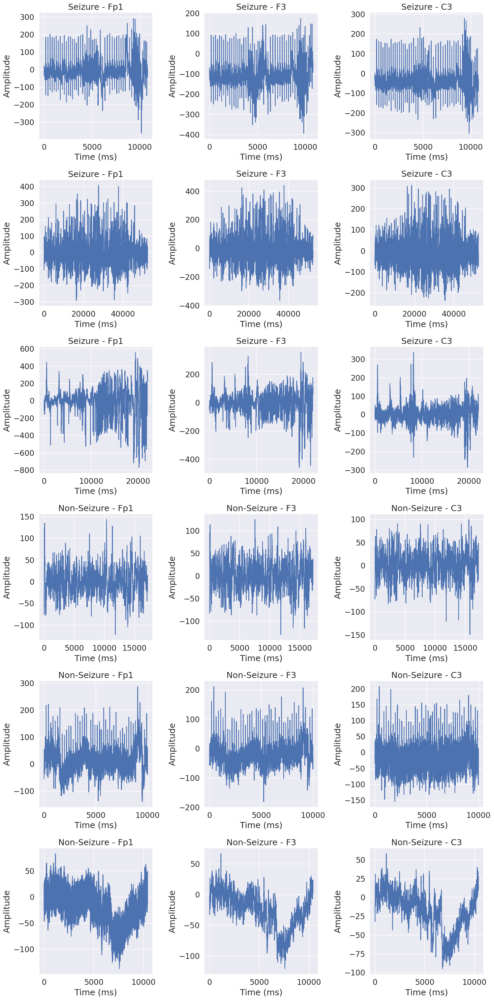

In [18]:
def plot_temporal_signals(eeg_df, num_samples=3, electrodes=["Fp1", "F3", "C3"]):
    """
    Plots temporal EEG signals for a random selection of seizure and non-seizure samples.
    
    Parameters:
        eeg_df (DataFrame): Dataframe containing EEG data and metadata.
        num_samples (int): Number of samples to visualize for seizure and non-seizure each.
        electrodes (list): List of electrode names to plot.
    """
    seizure_samples = eeg_df[eeg_df['is_seizure']].sample(n=num_samples, random_state=42)
    non_seizure_samples = eeg_df[~eeg_df['is_seizure']].sample(n=num_samples, random_state=42)

    # Total number of samples to plot
    total_samples = len(seizure_samples) + len(non_seizure_samples)
    
    # Adjust the number of rows in the subplot grid
    fig, axes = plt.subplots(total_samples, len(electrodes), figsize=(15, 5 * total_samples))

    for idx, sample in enumerate([*seizure_samples.iterrows(), *non_seizure_samples.iterrows()]):
        sample_data = sample[1]
        eeg_path = sample_data['eeg_path']
        eeg_data = pd.read_parquet(eeg_path)

        for col_idx, electrode in enumerate(electrodes):
            signal = eeg_data[electrode]

            # Handle single subplot case when there is only 1 row
            ax = axes[idx, col_idx] if total_samples > 1 else axes[col_idx]
            ax.plot(signal)
            ax.set_title(f"{'Seizure' if sample_data['is_seizure'] else 'Non-Seizure'} - {electrode}")
            ax.set_xlabel("Time (ms)")
            ax.set_ylabel("Amplitude")

    plt.tight_layout()
    plt.savefig("/kaggle/working/Temporal Consistency Analysis.png")
    plt.show()

# Execute the plotting
plot_temporal_signals(df, num_samples=3, electrodes=["Fp1", "F3", "C3"])

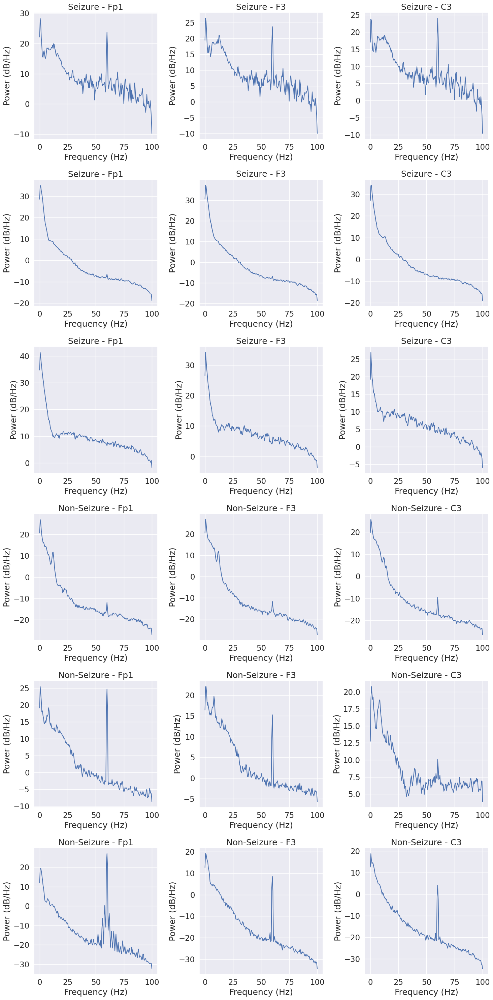

In [19]:
def preprocess_signal(signal, clip_threshold=1e6):
    """
    Preprocess the EEG signal by clipping and replacing NaN values.

    Parameters:
        signal (array-like): The raw EEG signal.
        clip_threshold (float): The threshold to clip spikes in the signal.

    Returns:
        array-like: The preprocessed EEG signal.
    """
    # Replace NaN values with the mean of the signal
    signal = np.nan_to_num(signal, nan=np.nanmean(signal))

    # Clip large spikes in the signal
    signal = np.clip(signal, -clip_threshold, clip_threshold)

    return signal

# Update the frequency analysis function
def plot_frequency_analysis_with_preprocessing(eeg_df, num_samples=3, electrodes=["Fp1", "F3", "C3"], fs=200):
    seizure_samples = eeg_df[eeg_df['is_seizure']].sample(n=num_samples, random_state=42)
    non_seizure_samples = eeg_df[~eeg_df['is_seizure']].sample(n=num_samples, random_state=42)

    total_samples = len(seizure_samples) + len(non_seizure_samples)
    fig, axes = plt.subplots(total_samples, len(electrodes), figsize=(15, 5 * total_samples))

    for idx, sample in enumerate([*seizure_samples.iterrows(), *non_seizure_samples.iterrows()]):
        sample_data = sample[1]
        eeg_path = sample_data['eeg_path']
        eeg_data = pd.read_parquet(eeg_path)

        for col_idx, electrode in enumerate(electrodes):
            signal = preprocess_signal(eeg_data[electrode])

            freqs, psd = welch(signal, fs=fs, nperseg=fs * 2)

            ax = axes[idx, col_idx] if total_samples > 1 else axes[col_idx]
            ax.plot(freqs, 10 * np.log10(psd + 1e-12))  # Add small constant to avoid log10(0)
            ax.set_title(f"{'Seizure' if sample_data['is_seizure'] else 'Non-Seizure'} - {electrode}")
            ax.set_xlabel("Frequency (Hz)")
            ax.set_ylabel("Power (dB/Hz)")

    plt.tight_layout()
    plt.savefig("/kaggle/working/Frequency Analysis.png")
    plt.show()

# Run the updated analysis
plot_frequency_analysis_with_preprocessing(df, num_samples=3, electrodes=["Fp1", "F3", "C3"], fs=200)

<h1 style="font-family: 'Arial', sans-serif; color: #4CAF50; text-align: center;">
    🧠 EEG Data Analysis and Report Generation 📊
</h1>

<p style="font-family: 'Verdana', sans-serif; color: #555555; font-size: 18px; text-align: center;">
    In this section, we perform a comprehensive analysis of EEG data to generate insightful visualizations, statistical summaries, and a well-structured report 📝. This includes:
</p>

<ul style="font-family: 'Courier New', monospace; font-size: 16px; color: #333333;">
    <li>🎨 Visual inspection of raw EEG signals.</li>
    <li>🔍 Power Spectral Density (PSD) analysis to explore frequency components.</li>
    <li>🛠️ Signal preprocessing and ICA decomposition.</li>
    <li>📊 Band-specific power analysis and signal-to-noise ratio (SNR) calculation.</li>
    <li>📈 Statistical properties and epoch-level noise analysis.</li>
    <li>📑 Generating a comprehensive Word report with all findings.</li>
</ul>

<p style="font-family: 'Arial', sans-serif; color: #f44336; font-size: 16px;">
    Let's dive in and analyze the EEG data! 🔬
</p>

In [20]:
# Create a folder for saving output if it doesn't exist
output_dir = '/kaggle/working/EEG Analysis'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Create a Word document
doc = Document()
doc.add_heading('EEG Data Analysis', 0)

# Function to add figures to the Word document
def add_figure_to_doc(fig, caption):
    img_stream = BytesIO()
    fig.savefig(img_stream, format='png')
    img_stream.seek(0)  # Rewind to the beginning of the image
    doc.add_picture(img_stream, width=Inches(5))  # Add image to the Word doc
    doc.add_paragraph(caption)

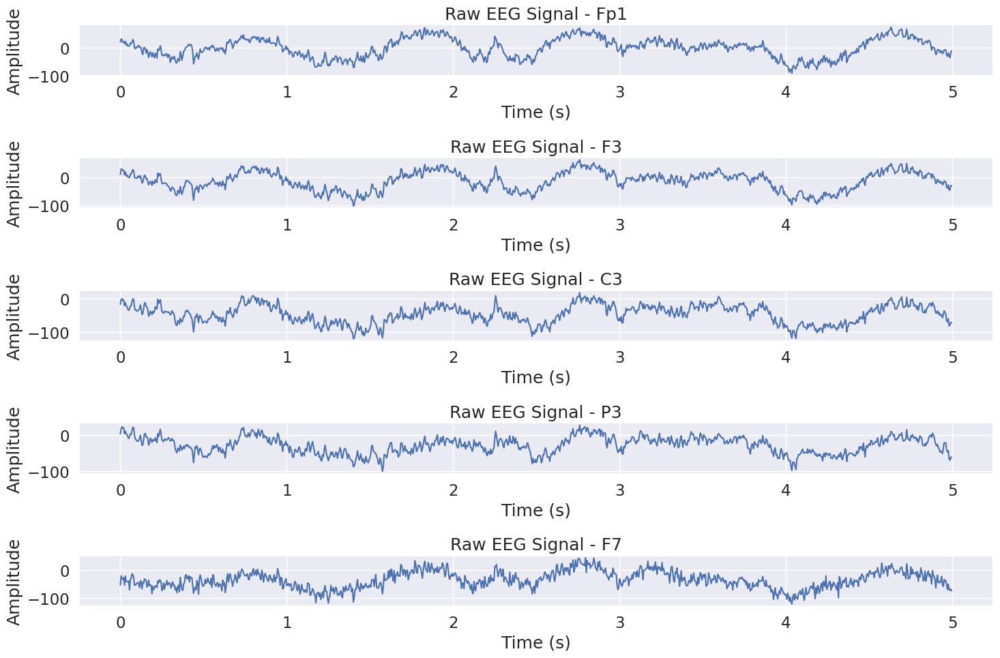

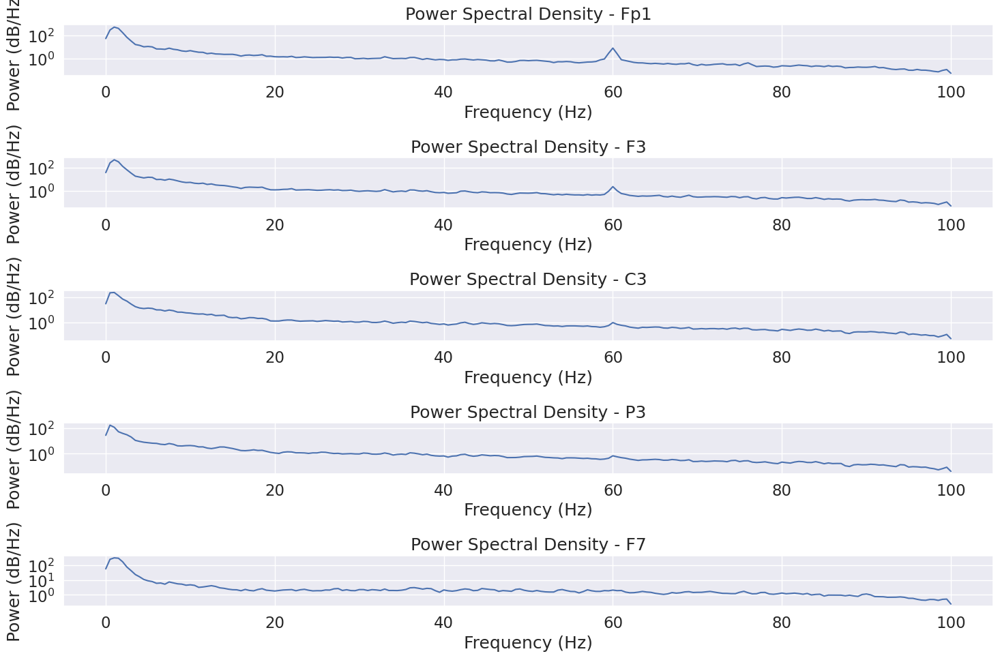

Flat Channels: []


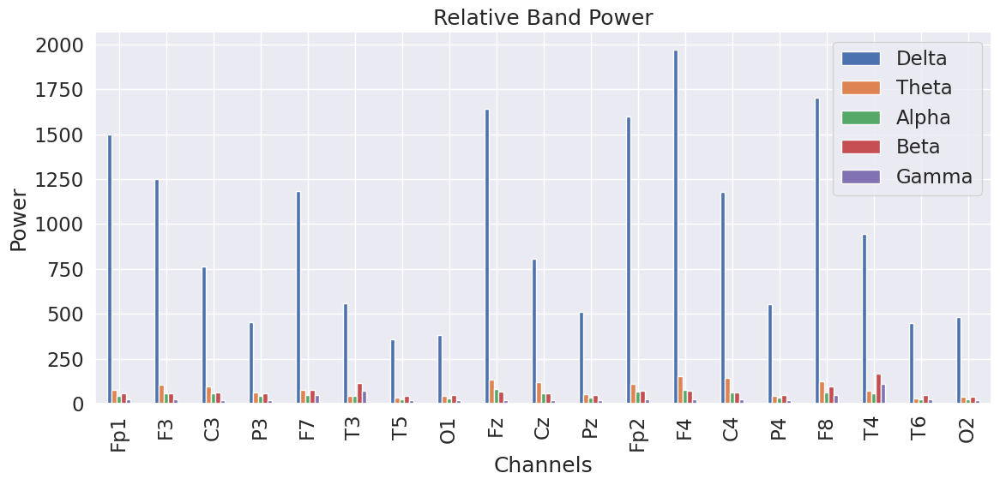

Creating RawArray with float64 data, n_channels=19, n_times=13200
    Range : 0 ... 13199 =      0.000 ...    65.995 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 661 samples (3.305 s)

Fitting ICA to data using 19 channels (please be patient, this may take a while)
Selecting by number: 19 components


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Fitting ICA took 1.2s.


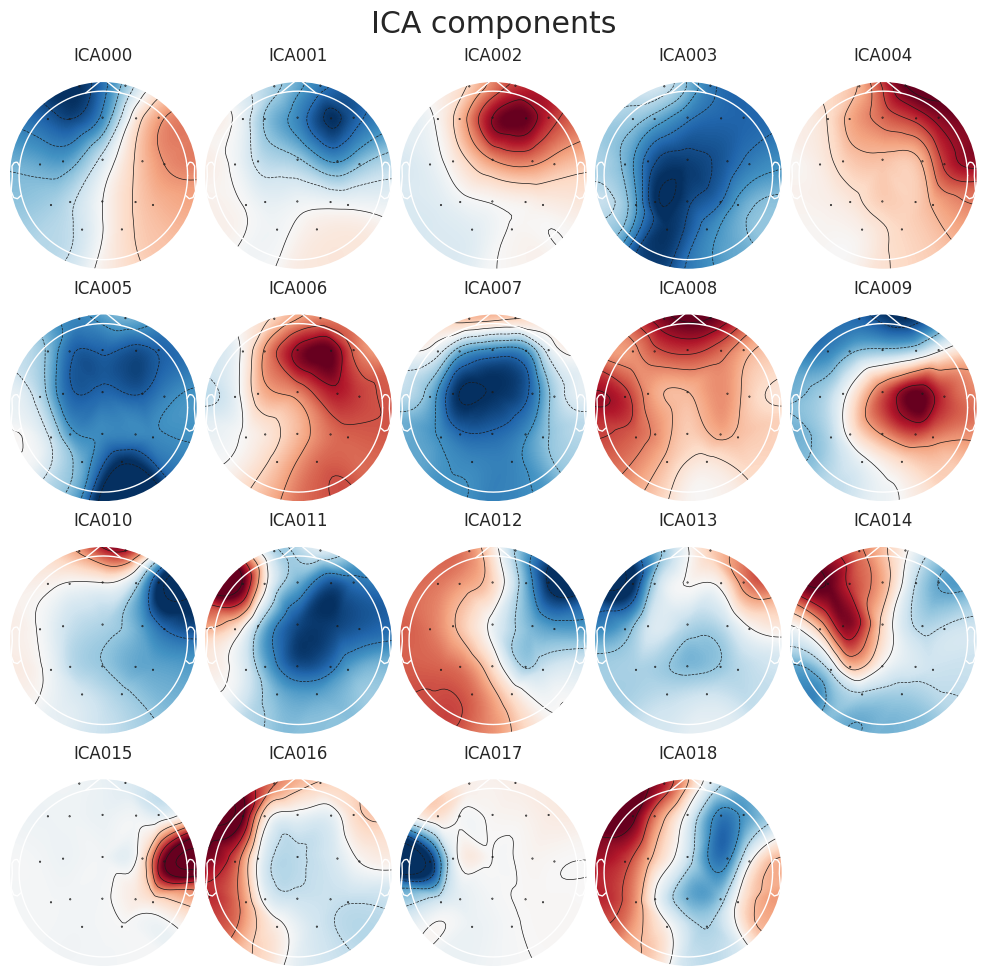

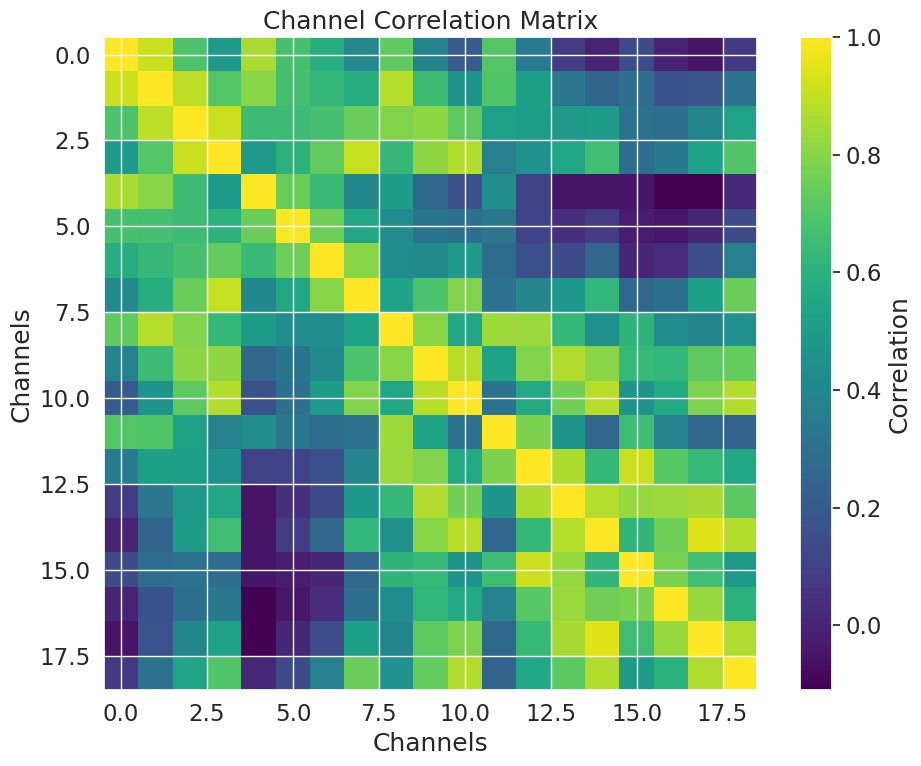

SNR for each channel:
Fp1     9.770021
F3     10.523314
C3     14.929163
P3     12.561788
F7      8.530413
T3      4.515453
T5     12.375206
O1      7.229038
Fz     10.860704
Cz     10.377765
Pz      8.631266
Fp2    10.142134
F4     10.217707
C4      9.061964
P4      7.747293
F8      6.405614
T4      3.752933
T6      5.854918
O2      8.480823
dtype: float32


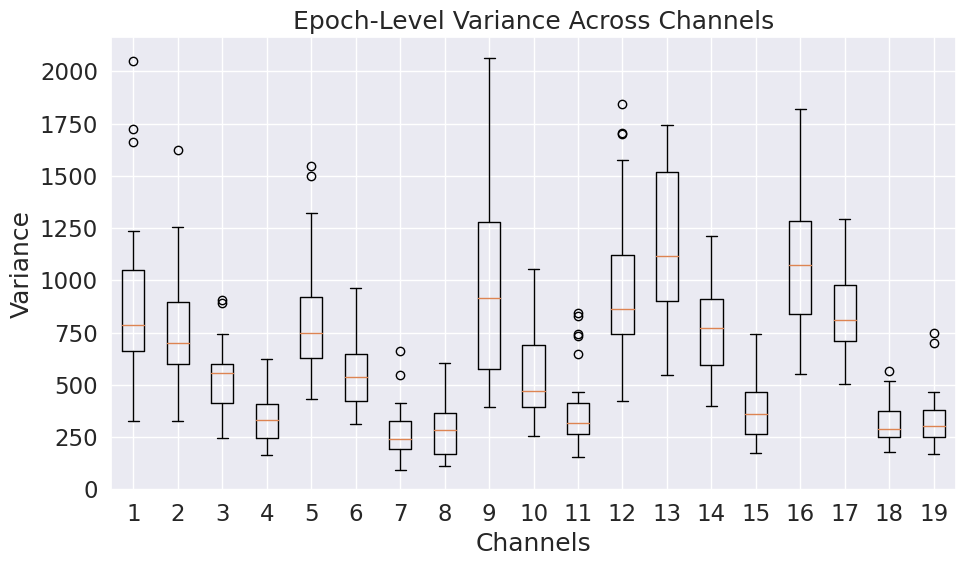

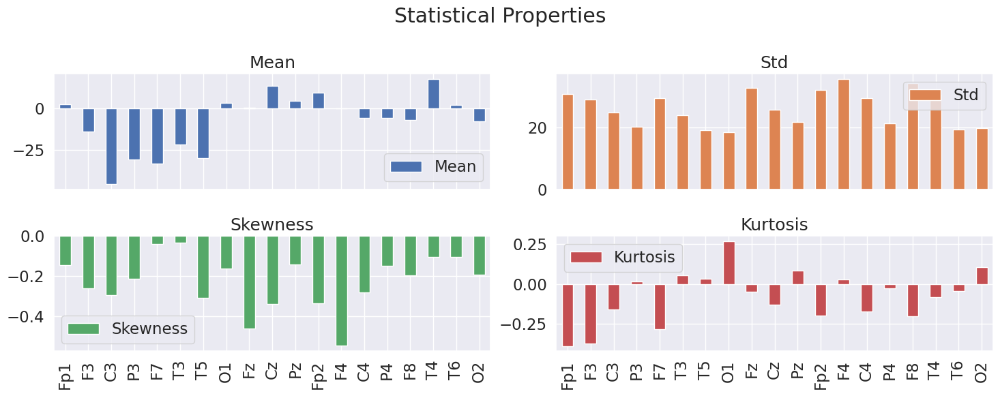

In [21]:
sampling_rate = 200  # Replace with your actual EEG sampling rate

# Channels
channels = eeg_data.columns

# 1. Visual Inspection: Plot raw EEG signals
def plot_raw_signals(eeg_data, channels, duration=5, fs=200):
    time = np.arange(eeg_data.shape[0]) / fs
    fig, axes = plt.subplots(5, 1, figsize=(15, 10))
    for i, channel in enumerate(channels[:5]):  # Plot first 5 channels
        axes[i].plot(time[:fs * duration], eeg_data[channel].iloc[:fs * duration])
        axes[i].set_title(f"Raw EEG Signal - {channel}")
        axes[i].set_xlabel("Time (s)")
        axes[i].set_ylabel("Amplitude")
    plt.tight_layout()
    add_figure_to_doc(fig, 'Raw EEG Signal for First 5 Channels')
    plt.show()

plot_raw_signals(eeg_data, channels)

# 2. Power Spectral Density (PSD) Analysis
def plot_psd(eeg_data, channels, fs=200):
    fig, axes = plt.subplots(5, 1, figsize=(15, 10))
    for i, channel in enumerate(channels[:5]):  # Plot first 5 channels
        freqs, psd = welch(eeg_data[channel], fs=fs, nperseg=fs * 2)
        axes[i].semilogy(freqs, psd)
        axes[i].set_title(f"Power Spectral Density - {channel}")
        axes[i].set_xlabel("Frequency (Hz)")
        axes[i].set_ylabel("Power (dB/Hz)")
    plt.tight_layout()
    add_figure_to_doc(fig, 'Power Spectral Density for First 5 Channels')
    plt.show()

plot_psd(eeg_data, channels)

# 3. Check for Missing Data or Flat Channels
def check_missing_flat_channels(eeg_data):
    channel_stats = eeg_data.describe().T
    flat_channels = channel_stats.loc[channel_stats['std'] == 0].index.tolist()
    doc.add_paragraph(f"Flat Channels: {flat_channels}")
    print(f"Flat Channels: {flat_channels}")
    return flat_channels

flat_channels = check_missing_flat_channels(eeg_data)

# 4. Band-Specific Analysis
def compute_band_power(eeg_data, fs=200):
    bands = {"Delta": (0.5, 4), "Theta": (4, 8), "Alpha": (8, 13), "Beta": (13, 30), "Gamma": (30, 40)}
    band_power = {}
    for band, (low, high) in bands.items():
        band_power[band] = eeg_data.apply(lambda x: welch(x, fs=fs, nperseg=fs * 2)[1][
            (low <= welch(x, fs=fs, nperseg=fs * 2)[0]) & 
            (welch(x, fs=fs, nperseg=fs * 2)[0] <= high)].sum(), axis=0)
    band_power = pd.DataFrame(band_power)
    band_power.plot(kind='bar', figsize=(12, 6), title="Relative Band Power")
    plt.ylabel("Power")
    plt.xlabel("Channels")
    plt.tight_layout()
    add_figure_to_doc(plt, 'Band-Specific Power Analysis')
    plt.show()

compute_band_power(eeg_data)

# 5. Independent Component Analysis (ICA)
def run_ica(eeg_data, sampling_rate=200, highpass_freq=1.0):
    n_channels = len(channels)
    info = create_info(ch_names=list(channels), sfreq=sampling_rate, ch_types=["eeg"] * n_channels)
    
    # Create random 3D coordinates for each channel
    # This is just for visualization purposes, ideally you'd use a proper montage
    info.set_montage('standard_1020')  # Standard system of EEG recordings
    
    # Create a RawArray from the EEG data
    raw_array = RawArray(eeg_data.values.T, info)
    
    # Apply high-pass filter to the data
    raw_array.filter(l_freq=highpass_freq, h_freq=None)  # High-pass filter with 1.0 Hz lower bound
    
    ica = ICA(n_components=n_channels, random_state=42)
    ica.fit(raw_array)  # Now fitting to RawArray
    
    # Plot ICA components and save the figure manually
    ica_fig = ica.plot_components(picks=None, show=False)  # This returns a figure
    ica_fig.savefig(os.path.join(output_dir, 'ica_components.png'))  # Save ICA components plot to file
    
    # Add the ICA components plot to the document
    add_figure_to_doc(ica_fig, 'Independent Component Analysis (ICA) Components')
    return ica

ica = run_ica(eeg_data)

# 6. Correlation Between Channels
def plot_channel_correlation(eeg_data):
    corr_matrix = eeg_data.corr()
    fig, ax = plt.subplots(figsize=(10, 8))
    cax = ax.imshow(corr_matrix, cmap='viridis', interpolation='none')
    fig.colorbar(cax, ax=ax, label='Correlation')
    ax.set_title("Channel Correlation Matrix")
    ax.set_xlabel("Channels")
    ax.set_ylabel("Channels")
    plt.tight_layout()
    add_figure_to_doc(fig, 'Channel Correlation Matrix')
    plt.show()

plot_channel_correlation(eeg_data)

# 7. Signal-to-Noise Ratio (SNR)
def compute_snr(eeg_data):
    signal_power = (eeg_data ** 2).mean(axis=0)
    noise_power = eeg_data.diff().dropna() ** 2
    noise_power = noise_power.mean(axis=0)
    snr = 10 * np.log10(signal_power / noise_power)
    doc.add_paragraph("Signal-to-Noise Ratio (SNR) for each channel:")
    doc.add_paragraph(snr.to_string())
    print("SNR for each channel:")
    print(snr)
    return snr

snr = compute_snr(eeg_data)

# 8. Epoch-Level Noise Analysis
def check_epoch_noise(eeg_data, epoch_duration=2, fs=200):
    epoch_samples = fs * epoch_duration
    num_epochs = eeg_data.shape[0] // epoch_samples
    variances = []
    for i in range(num_epochs):
        epoch = eeg_data.iloc[i * epoch_samples:(i + 1) * epoch_samples]
        variances.append(epoch.var(axis=0))
    variances = pd.DataFrame(variances)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.boxplot(variances.values)
    ax.set_title("Epoch-Level Variance Across Channels")
    ax.set_xlabel("Channels")
    ax.set_ylabel("Variance")
    plt.tight_layout()
    add_figure_to_doc(fig, 'Epoch-Level Variance Across Channels')
    plt.show()

check_epoch_noise(eeg_data)

# 9. Statistical Properties
def plot_statistical_properties(eeg_data):
    stats = {
        "Mean": eeg_data.mean(),
        "Std": eeg_data.std(),
        "Skewness": eeg_data.apply(skew),
        "Kurtosis": eeg_data.apply(kurtosis),
    }
    stats_df = pd.DataFrame(stats)
    stats_df.plot(kind='bar', figsize=(15, 6), subplots=True, layout=(2, 2), title="Statistical Properties")
    plt.tight_layout()
    add_figure_to_doc(plt, 'Statistical Properties')
    plt.show()

plot_statistical_properties(eeg_data)

# Save the Word document
doc.save(os.path.join(output_dir, 'EEG_Analysis_Report.docx'))


<h1 style="font-family: 'Arial', sans-serif; color: #2196F3; text-align: center;">
    🔎 Signal-to-Noise Ratio (SNR) Computation and Feature Extraction 📊
</h1>

<p style="font-family: 'Verdana', sans-serif; color: #555555; font-size: 18px; text-align: center;">
    In this section, we compute the Signal-to-Noise Ratio (SNR) for each EEG file, filter out channels with low SNR, and use a classification model to identify most important channels in seizure detection. The steps include:
</p>

<ul style="font-family: 'Courier New', monospace; font-size: 16px; color: #333333;">
    <li>📈 Computation of SNR for each EEG file.</li>
    <li>🔍 Filtering channels with high SNR values for more reliable features.</li>
    <li>⚖️ Balancing seizure and non-seizure data for model training.</li>
    <li>🤖 Training a Random Forest classifier on SNR-optimized features.</li>
    <li>📊 Displaying feature importance to identify key channels for classification.</li>
</ul>

<p style="font-family: 'Arial', sans-serif; color: #FF5722; font-size: 16px;">
    Let's extract meaningful insights from EEG data and important channels for seizure detection! ⚡
</p>

In [22]:
# Function to compute SNR for one file
def compute_snr_for_file(eeg_file, clip_threshold=1e6):
    eeg_data = pd.read_parquet(eeg_file)
    eeg_data.drop(columns=["EKG"], inplace=True)
    
    # Handle NaNs or Infs
    if eeg_data.isnull().values.any() or np.isinf(eeg_data.values).any():
        eeg_data = eeg_data.fillna(0)
        eeg_data = eeg_data.replace([np.inf, -np.inf], 0)
    
    eeg_data = eeg_data.clip(-clip_threshold, clip_threshold)  # Clip extreme values

    # Compute signal and noise power
    signal_power = (eeg_data ** 2).mean(axis=0)
    if np.isnan(signal_power).any():
        print(f"Warning: NaN values detected in signal power for {eeg_file}.")
    
    noise_power = eeg_data.diff().dropna() ** 2
    noise_power = noise_power.mean(axis=0)
    if np.isnan(noise_power).any():
        print(f"Warning: NaN values detected in noise power for {eeg_file}.")
    
    # Add small epsilon to avoid log(0)
    epsilon = 1e-10
    snr = 10 * np.log10((signal_power + epsilon) / (noise_power + epsilon))
    
    return snr

# Randomly sample EEG files for analysis
sample_files = df.sample(100, random_state=CFG.seed)['eeg_path']

# Compute SNR for each file
snr_results = []
for file in sample_files:
    snr = compute_snr_for_file(file)
    snr_results.append(snr)

# Aggregate SNR results across files
snr_df = pd.DataFrame(snr_results).mean(axis=0)
print("Average SNR for Channels:")
print(snr_df)

# Filter channels with high SNR
snr_threshold = 0  # Adjust based on results
high_snr_channels = snr_df[snr_df > snr_threshold].index.tolist()
print("High-SNR Channels:", high_snr_channels)

Average SNR for Channels:
Fp1    12.831826
F3     12.581757
C3     13.018909
P3     13.730405
F7     12.734032
T3     12.011728
T5     11.882221
O1     13.684000
Fz     14.138827
Cz     13.258566
Pz     13.789523
Fp2    12.894209
F4     11.903696
C4     12.432629
P4     13.117107
F8     12.915751
T4     11.740618
T6     12.130501
O2     12.625462
dtype: float32
High-SNR Channels: ['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz', 'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2']


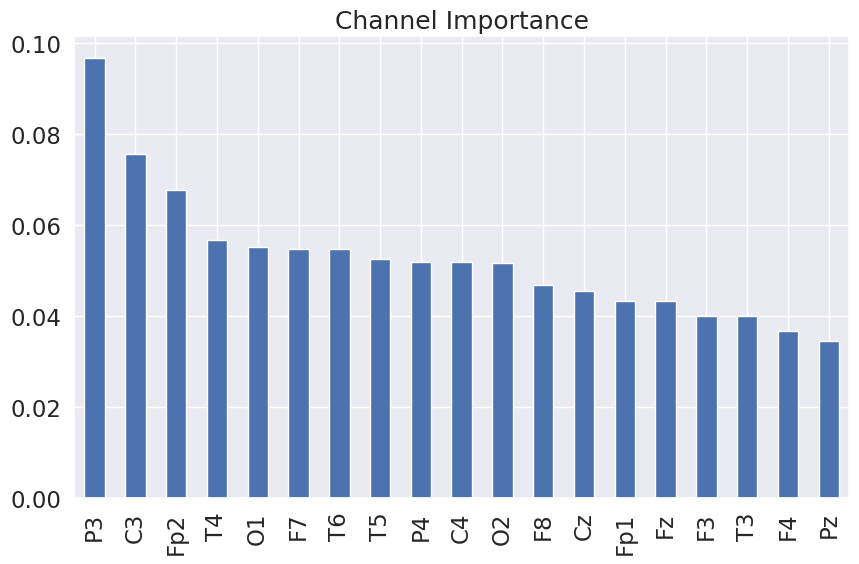

Accuracy: 0.55


In [23]:
# Select a balanced subset of seizure and non-seizure data
seizure_files = df[df['is_seizure']]['eeg_path'].sample(50, random_state=CFG.seed)
non_seizure_files = df[~df['is_seizure']]['eeg_path'].sample(50, random_state=CFG.seed)
files_to_process = pd.concat([seizure_files, non_seizure_files])

# Prepare data for classification
X, y = [], []
for file in files_to_process:
    eeg_data = pd.read_parquet(file)[high_snr_channels]
    X.append(eeg_data.mean(axis=0))  # Aggregate features (e.g., mean)
    y.append(df.loc[df['eeg_path'] == file, 'is_seizure'].values[0])

# Convert to DataFrame
X = pd.DataFrame(X, columns=high_snr_channels)
y = np.array(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=CFG.seed)

# Train a Random Forest Classifier
rf_model = RandomForestClassifier(random_state=CFG.seed)
rf_model.fit(X_train, y_train)

# Feature importance
importances = pd.Series(rf_model.feature_importances_, index=high_snr_channels)
importances.sort_values(ascending=False).plot(kind='bar', figsize=(10, 6), title="Channel Importance")
plt.savefig("Feature Importance.png")
plt.show()

<h1 style="font-family: 'Arial', sans-serif; color: #4CAF50; text-align: center;">
    🧠 EEG Data Preprocessing & Feature Engineering 🧹
</h1>

<p style="font-family: 'Verdana', sans-serif; color: #555555; font-size: 18px; text-align: center;">
    In this section, we perform detailed preprocessing of EEG data to ensure high-quality features for further analysis:
</p>

<ul style="font-family: 'Courier New', monospace; font-size: 16px; color: #333333;">
    <li>📊 Channel Selection: Only the top channels are selected for analysis.</li>
    <li>🔄 Data Cleaning: Handle NaNs, infinities, and normalize the EEG data.</li>
    <li>🌀 Wavelet Denoising: Apply wavelet transforms for denoising the signals.</li>
    <li>⚙️ Variance & SNR Checks: Filter out data with low variance or negative SNR values.</li>
    <li>⏳ Data Downsampling: Reduce the data to 30 seconds of samples for uniformity.</li>
    <li>💾 Saving Processed Data: Convert the cleaned data to NumPy format and save it for later use.</li>
</ul>

<p style="font-family: 'Arial', sans-serif; color: #FF9800; font-size: 16px;">
    After processing, we check the distribution of expert consensus and patient data. 📊
</p>

In [21]:
# Selected top channels based on analysis
SELECTED_CHANNELS = ['Fp1', 'O2', 'T6', 'Fz', 'F4', 'T3', 'Cz', 'T5', 'C4', 'P3']

# Define thresholds
LOW_VARIANCE_THRESHOLD = 0.001
HIGH_VARIANCE_THRESHOLD = 10

def wavelet_denoise(data, wavelet="db4", level=2):
    coeffs = pywt.wavedec(data, wavelet, axis=0)
    threshold = np.median(np.abs(coeffs[-1])) / 0.6745  # Universal threshold
    coeffs = [pywt.threshold(c, threshold, mode="soft") for c in coeffs]
    return pywt.waverec(coeffs, wavelet, axis=0)

def calculate_snr(signal):
    mean_signal = np.mean(signal)
    noise = signal - mean_signal
    snr = 10 * np.log10(np.var(signal) / np.var(noise))
    return snr

# Define a function to process a single eeg_id
def evaluate_eeg(eeg_id):
    eeg_path = f"{BASE_PATH}/train_eegs/{eeg_id}.parquet"
    try:
        # Load EEG data
        eeg = pd.read_parquet(eeg_path)
        
        # Select relevant channels
        chan_eeg = eeg[SELECTED_CHANNELS]
        
        # Replace NaN and infinite values
        chan_eeg = chan_eeg.replace([np.inf, -np.inf], 0).fillna(0)

        # Apply bandpass filtering
        chan_eeg = bandpass_filter(chan_eeg)

        # Wavelet denoising
        chan_eeg = wavelet_denoise(chan_eeg)

        # Normalize data with safeguard for zero standard deviation
        stds = chan_eeg.std(axis=0)
        stds[stds == 0] = 1e-8  # Replace zero stds with a small constant
        normalized_eeg = (chan_eeg - chan_eeg.mean(axis=0)) / stds
        normalized_eeg = np.nan_to_num(normalized_eeg)  # Ensure no NaN or inf values

        # Variance checks
        variances = normalized_eeg.var(axis=0)
        if (variances < LOW_VARIANCE_THRESHOLD).any() or (variances > HIGH_VARIANCE_THRESHOLD).any():
            # print(f"Discarded {eeg_id} due to variance thresholds after preprocessing.")
            return None

        # SNR checks
        snr_values = np.apply_along_axis(calculate_snr, axis=0, arr=normalized_eeg)
        if (snr_values < 0).any():
            # print(f"Discarded {eeg_id} due to negative SNR after preprocessing.")
            return None
        
        # Undersample to 6,000 rows
        # The EEGs were recored at 200 samples / second
        # 200 * 30 = 6000 Samples
        # Therefore we will pick first 6000 samples which will consolidate 30 seconds of recording
        sub_eeg = normalized_eeg[:6000, :]
        
        # Convert to NumPy and save
        # eeg_np = sub_eeg.to_numpy(dtype='float', na_value=0)
        return sub_eeg  # Return eeg_id if successfully processed
    
    except Exception as e:
        # print(f"Error processing {eeg_id}: {e}")
        return None

def process_and_save_eeg(eeg_id):
    processed = evaluate_eeg(eeg_id)
    if processed is not None:
        np.save(f"{EEG_DIR}/{eeg_id}.npy", processed)
        return eeg_id  # Return ID if successfully processed
    return None

if __name__ == "__main__":
    # Collect all processed EEG IDs
    results = Parallel(n_jobs=-1, backend="loky")(
        delayed(process_and_save_eeg)(eeg_id)
        for eeg_id in tqdm(df["eeg_id"], desc="Processing EEG files")
    )

    # Filter out None values and save successfully processed IDs
    accepted_eegs = [eeg_id for eeg_id in results if eeg_id is not None]
    print(f"Successfully processed {len(accepted_eegs)} EEG files.")


Processing EEG files:   0%|          | 0/5570 [00:00<?, ?it/s]

Successfully processed 5508 EEG files.


In [105]:
accepted_df = df[df["eeg_id"].isin(accepted_eegs)]
class_counts = accepted_df['expert_consensus'].value_counts()
patients = accepted_df["patient_id"].value_counts()
display(class_counts)

expert_consensus
Seizure    2759
Other      1376
LPD         497
GPD         362
GRDA        342
LRDA        172
Name: count, dtype: int64

<h1 style="font-family: 'Arial', sans-serif; color: #FF5722; text-align: center;">
    🔄 Data Splitting & Augmentation for Model Training 🔁
</h1>

<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 18px; text-align: center;">
    In this section, we perform the following key steps for model training:
</p>

<ul style="font-family: 'Courier New', monospace; font-size: 16px; color: #333333;">
    <li>📊 Stratified K-Fold Splitting: Split the data into 5 folds, ensuring each fold has a balanced distribution of seizure and non-seizure labels.</li>
    <li>⚡ Data Augmentation: Enhance the EEG data by adding Gaussian noise and applying random time shifts to increase the model's robustness.</li>
    <li>🔧 Data Preprocessing: Apply necessary preprocessing steps, such as reshaping data and adding a channel dimension.</li>
    <li>💻 TensorFlow Datasets: Convert the data into efficient TensorFlow datasets, enabling parallel processing for faster training.</li>
</ul>

<p style="font-family: 'Arial', sans-serif; color: #8E24AA; font-size: 16px;">
    These prepared datasets are ready for training deep learning models on EEG data. 🧠💡
</p>

In [23]:
# Encode the "is_seizure" label (True -> 1, False -> 0)
accepted_df["is_seizure"] = accepted_df["is_seizure"].astype(int)

# Convert to NumPy arrays
eeg_ids = accepted_df["eeg_id"].to_numpy()
labels = accepted_df["is_seizure"].to_numpy()

# Number of folds
n_splits = 5

skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=CFG.seed)
splits = list(skf.split(eeg_ids, labels))

# Placeholder to store datasets for each fold
fold_datasets = []

# Function to load EEG data from .npy files
def load_eeg(eeg_id, label):
    eeg_id_str = tf.strings.as_string(eeg_id)
    eeg_path = tf.strings.join([EEG_DIR, tf.strings.join([eeg_id_str, ".npy"], separator="")], separator="/")
    eeg_data = tf.numpy_function(np.load, [eeg_path], tf.float64)
    eeg_data = tf.cast(eeg_data, tf.float32)
    eeg_data = tf.ensure_shape(eeg_data, [6000, 10])
    return eeg_data, label

# Function to apply data augmentation
def augment_data(eeg_data, label):
    # Add Gaussian noise
    noise = tf.random.normal(tf.shape(eeg_data), mean=0.0, stddev=0.02)
    eeg_data = eeg_data + noise

    # Random time shifting
    time_shift = tf.random.uniform([], minval=-50, maxval=50, dtype=tf.int32)
    eeg_data = tf.roll(eeg_data, shift=time_shift, axis=0)

    return eeg_data, label

# Function to preprocess the data
def preprocess_data(eeg_data, label):
    eeg_data = tf.expand_dims(eeg_data, axis=-1)  # Add a channel dimension: (6000, 10) -> (6000, 10, 1)
    return eeg_data, label

# Function to create TensorFlow datasets for a fold
def create_fold_dataset(train_idx, test_idx):
    # Get train and test EEG IDs and labels
    train_ids, train_labels = eeg_ids[train_idx], labels[train_idx]
    test_ids, test_labels = eeg_ids[test_idx], labels[test_idx]

    # Create TensorFlow datasets
    train_dataset = tf.data.Dataset.from_tensor_slices((train_ids, train_labels))
    test_dataset = tf.data.Dataset.from_tensor_slices((test_ids, test_labels))

    # Map the loading and preprocessing functions
    train_dataset = train_dataset.map(
        lambda eeg_id, label: load_eeg(eeg_id, label), num_parallel_calls=tf.data.AUTOTUNE
    )
    train_dataset = train_dataset.map(preprocess_data, num_parallel_calls=tf.data.AUTOTUNE)
    test_dataset = test_dataset.map(
        lambda eeg_id, label: load_eeg(eeg_id, label), num_parallel_calls=tf.data.AUTOTUNE
    )
    test_dataset = test_dataset.map(preprocess_data, num_parallel_calls=tf.data.AUTOTUNE)

    # Shuffle, batch, and prefetch
    batch_size = CFG.batch_size
    train_dataset = train_dataset.shuffle(buffer_size=1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    test_dataset = test_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return train_dataset, test_dataset

# Loop through each fold and create datasets
for i, (train_idx, test_idx) in enumerate(splits):
    print(f"Creating datasets for Fold {i + 1}")
    train_dataset, test_dataset = create_fold_dataset(train_idx, test_idx)
    fold_datasets.append((train_dataset, test_dataset))

print(f"Successfully created datasets for {n_splits} folds.")


Creating datasets for Fold 1
Creating datasets for Fold 2
Creating datasets for Fold 3
Creating datasets for Fold 4
Creating datasets for Fold 5
Successfully created datasets for 5 folds.


<h1 style="font-family: 'Arial', sans-serif; color: #FF5722; text-align: center;">
    🧠 CNN-LSTM Model for EEG Classification 🧠
</h1>

<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 18px; text-align: center;">
    This model is designed for EEG data classification, specifically to distinguish between seizure and non-seizure events, using a combination of Convolutional Neural Networks (CNNs) and Long Short-Term Memory (LSTM) networks. Below is a detailed breakdown of each layer and its purpose.
</p>

<h2 style="font-family: 'Verdana', sans-serif; color: #FF4081; font-size: 20px;">
    📋 Model Summary
</h2>

<p style="font-family: 'Arial', sans-serif; color: #333333; font-size: 16px;">
    The CNN-LSTM architecture efficiently combines both spatial feature extraction (through CNN layers) and temporal dependency capture (through LSTM layers). This hybrid approach enables the model to effectively handle the spatiotemporal nature of EEG data. The model works as follows:
</p>

<ul style="font-family: 'Courier New', monospace; font-size: 16px; color: #333333;">
    <li><strong>Input Layer:</strong> Accepts input EEG data with a shape of (6000, 10, 1), representing 6000 time steps with 10 channels.</li>
    <li><strong>CNN Block (Spatial Feature Extraction):</strong> Extracts spatial features using convolutional layers and downsamples the spatial dimensions using max-pooling.</li>
    <li><strong>Reshaping:</strong> Flattens the output from the CNN block to prepare for sequential processing by LSTM layers.</li>
    <li><strong>LSTM Block (Temporal Dependency Capture):</strong> Captures the temporal dependencies within the EEG signal using Bidirectional LSTM layers.</li>
    <li><strong>Fully Connected Layers (Classification):</strong> Classifies the extracted features into seizure or non-seizure categories using dense layers.</li>
</ul>

<h2 style="font-family: 'Verdana', sans-serif; color: #FF4081; font-size: 20px;">
    🧩 Layer Breakdown & Functionality
</h2>

<h3 style="font-family: 'Arial', sans-serif; color: #FF9800;">1. Input Layer</h3>
<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 16px;">
    This layer receives the EEG data in the shape of (6000, 10, 1). The first dimension represents 6000 time steps, the second represents 10 EEG channels, and the third represents a single feature (since the data is 1D in this case).
</p>

<h3 style="font-family: 'Arial', sans-serif; color: #FF9800;">2. CNN Block (Spatial Feature Extraction)</h3>
<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 16px;">
    This block includes two convolutional layers followed by batch normalization and max-pooling layers:
    <ul>
        <li><strong>Conv2D (Convolution-1):</strong> Applies 32 filters with a kernel size of (1, 5), allowing the model to capture spatial features from EEG data. The 'relu' activation function is used to introduce non-linearity.</li>
        <li><strong>BatchNormalization (Normalization-1):</strong> Normalizes the output of the convolutional layer to stabilize and speed up training by reducing internal covariate shift.</li>
        <li><strong>MaxPooling2D (Pooling-1):</strong> Downsamples the feature map along the width dimension by a factor of 2, reducing the spatial complexity and focusing on the most salient features.</li>
        <li><strong>Conv2D (Convolution-2):</strong> Applies 64 filters with a smaller kernel size of (1, 3), helping the model to capture finer spatial details.</li>
        <li><strong>BatchNormalization (Normalization-2):</strong> Similar to the first batch normalization step, this layer ensures more stable learning.</li>
        <li><strong>MaxPooling2D (Pooling-2):</strong> Further reduces the spatial dimensions by another factor of 2, leading to a final output shape of (6000, 2, 64). This is crucial for focusing the network on essential features.</li>
    </ul>
</p>

<h3 style="font-family: 'Arial', sans-serif; color: #FF9800;">3. Temporal Downsampling (Reshape for LSTM)</h3>
<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 16px;">
    The output from the CNN block is reshaped from (6000, 2, 64) to (6000, 128) in preparation for the LSTM layers. This transformation ensures that the data is compatible for sequential learning by the LSTM, which is vital for capturing temporal dependencies.
</p>

<h3 style="font-family: 'Arial', sans-serif; color: #FF9800;">4. LSTM Block (Temporal Dependency Capture)</h3>
<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 16px;">
    The LSTM layers are designed to capture long-range temporal dependencies in the EEG signals:
    <ul>
        <li><strong>Bidirectional LSTM (Bi-LSTM-1):</strong> This layer has 128 units and processes the EEG data in both forward and backward directions, improving the model's ability to learn from past and future context.</li>
        <li><strong>Dropout (Dropout-1):</strong> A dropout rate of 0.2 is used to prevent overfitting by randomly dropping neurons during training.</li>
        <li><strong>Bidirectional LSTM (Bi-LSTM-2):</strong> A second Bi-LSTM layer with 64 units further enhances the model's ability to capture sequential patterns in the data.</li>
    </ul>
</p>

<h3 style="font-family: 'Arial', sans-serif; color: #FF9800;">5. Fully Connected Layers (Classification)</h3>
<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 16px;">
    The fully connected layers are used for classification:
    <ul>
        <li><strong>Dense (Dense-1):</strong> A fully connected layer with 64 units and 'relu' activation, which learns the high-level representation of the data.</li>
        <li><strong>Dropout (Dropout-2):</strong> Another dropout layer with a rate of 0.2 to prevent overfitting.</li>
        <li><strong>Dense (Dense-2):</strong> A second dense layer with 32 units that refines the learned features further.</li>
        <li><strong>Output Layer:</strong> The final dense layer has units equal to the number of classes (2 in this case, for seizure vs. non-seizure) and uses 'softmax' activation to produce class probabilities.</li>
    </ul>
</p>

<h2 style="font-family: 'Verdana', sans-serif; color: #FF4081; font-size: 20px;">
    ⚙️ Hyperparameter Breakdown
</h2>

<h3 style="font-family: 'Arial', sans-serif; color: #FF9800;">1. Optimizer: Adam</h3>
<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 16px;">
    <strong>Functionality:</strong> The Adam optimizer is an adaptive learning rate optimization algorithm that combines the advantages of both RMSprop and momentum. It computes adaptive learning rates for each parameter from estimates of first and second moments of the gradients.
    <br><strong>Reason for Usage:</strong> Adam is chosen for its efficiency, scalability, and ability to work well with sparse gradients, which is particularly useful in EEG classification where the data can be noisy and sparse.
</p>

<h3 style="font-family: 'Arial', sans-serif; color: #FF9800;">2. Loss Function: Sparse Categorical Crossentropy</h3>
<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 16px;">
    <strong>Functionality:</strong> This loss function is used for multi-class classification problems where labels are provided as integers. It computes the cross-entropy loss between the true labels and the predicted probabilities.
    <br><strong>Reason for Usage:</strong> Sparse categorical crossentropy is used since the target labels (seizure vs. non-seizure) are integers, making it suitable for this classification task.
</p>

<h3 style="font-family: 'Arial', sans-serif; color: #FF9800;">3. Metrics: Accuracy</h3>
<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 16px;">
    Accuracy is a standard metric for classification tasks. It calculates the proportion of correct predictions over the total number of predictions.
</p>

In [41]:
def create_cnn_lstm(input_shape=(6000, 10, 1), num_classes=2):
    model = models.Sequential(name="CNN-BiLSTM-Model")

    # Input Layer
    model.add(layers.Input(shape=input_shape, name="Input-Layer"))
    
    # 1. CNN Block (Spatial Feature Extraction)
    model.add(layers.Conv2D(name="Convolution-1", filters=32, kernel_size=(1, 5), activation='relu', padding='same'))  # Added padding
    model.add(layers.BatchNormalization(name="Normalization-1"))
    model.add(layers.MaxPooling2D(name="Pooling-1", pool_size=(1, 2)))  # Reduces the width by a factor of 2

    model.add(layers.Conv2D(name="Convolution-2", filters=64, kernel_size=(1, 3), activation='relu', padding='same'))  # Added padding
    model.add(layers.BatchNormalization(name="Normalization-2"))
    model.add(layers.MaxPooling2D(name="Pooling-2", pool_size=(1, 2)))  # Reduces the width by a factor of 2
    
    # After Conv2D and MaxPooling layers, the shape is reduced to:
    # Height = 6000 (unchanged), Width = 10 -> (10 / 2 / 2) = 2, Depth = 64
    # So, the shape after this block is (6000, 2, 64)
    
    # 2. Temporal Downsampling (Reshape for LSTM)
    # The output shape after CNN and Pooling is (6000, 2, 64), so we reshape it to (6000, 128)
    model.add(layers.Reshape(name="Reshape-Conv-Output", target_shape=(6000, 128)))  # 6000 time steps, 128 features
    
    # 3. LSTM Block (Temporal Dependency Capture)
    model.add(layers.Bidirectional(layers.LSTM(128, return_sequences=True), name="Bi-LSTM-1"))
    model.add(layers.Dropout(0.2, name="Dropout-1"))
    model.add(layers.Bidirectional(layers.LSTM(64), name="Bi-LSTM-2"))

    # 4. Fully Connected Layers (Classification)
    model.add(layers.Dense(64, name="Dense-1", activation='relu'))
    model.add(layers.Dropout(0.2, name="Dropout-2"))
    model.add(layers.Dense(32, name="Dense-2", activation='relu'))
    model.add(layers.Dense(num_classes, name="Output-Layer", activation='softmax'))

    # Compile the model
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Instantiate the model
model = create_cnn_lstm()
model.summary()


Model: "CNN-BiLSTM-Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Convolution-1 (Conv2D)               │ (None, 6000, 10, 32)        │             192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Normalization-1 (BatchNormalization) │ (None, 6000, 10, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pooling-1 (MaxPooling2D)             │ (None, 6000, 5, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Convolution-2 (Conv2D)               │ (None, 6000, 5, 64)         │           6,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Normalization-2 (BatchNormalization) │ (None, 6000, 5, 64)         │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Pooling-2 (MaxPooling2D)             │ (None, 6000, 2, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Reshape-Conv-Output (Reshape)        │ (None, 6000, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Bi-LSTM-1 (Bidirectional)            │ (None, 6000, 256)           │         263,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dropout-1 (Dropout)                  │ (None, 6000, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Bi-LSTM-2 (Bidirectional)            │ (None, 128)                 │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense-1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dropout-2 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense-2 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Output-Layer (Dense)                 │ (None, 2)                   │              66 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 444,706 (1.70 MB)

 Trainable params: 444,514 (1.70 MB)

 Non-trainable params: 192 (768.00 B)

<h1 style="font-family: 'Arial', sans-serif; color: #FF5722; text-align: center;">
    🚀 Model Training Optimization with Callbacks 🧠
</h1>

<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 18px; text-align: center;">
    In this cell, we implement the following key callbacks for optimizing model training:
</p>

<ul style="font-family: 'Courier New', monospace; font-size: 16px; color: #333333;">
    <li>📂 <strong>ModelCheckpoint:</strong> Saves the model based on validation loss, ensuring we retain the best performing model throughout training.</li>
    <li>⏱️ <strong>EarlyStopping:</strong> Monitors the validation loss and halts training if there is no improvement for a defined number of epochs, preventing overfitting and saving resources.</li>
</ul>

<p style="font-family: 'Arial', sans-serif; color: #8E24AA; font-size: 16px;">
    These callbacks will help in optimizing the training process and achieving better model performance. 💻✨
</p>


In [39]:
ckpt_cb = tf.keras.callbacks.ModelCheckpoint(
    'cnn_lstm.keras',                # File path to save the model
    monitor="val_loss",
    save_best_only=True,             # Save regardless of validation loss
    save_weights_only=False,         # Save the full model (not just weights)
    save_freq='epoch',               # Save at the end of each epoch (which is the default)
    verbose=0                        # Display a message when saving
)

# Early stopping callback
erst_cb = EarlyStopping(
    monitor="val_loss",  # Monitor validation loss
    patience=3,          # Number of epochs to wait before stopping
    restore_best_weights=True,  # Restore the model with the best weights
    verbose=CFG.verbose
)

<h1 style="font-family: 'Arial', sans-serif; color: #FF5722; text-align: center;">
    🔄 Training & Evaluation of the Model Across Folds 🧠
</h1>

<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 18px; text-align: center;">
    In this section, we perform the following key steps to train and evaluate the model across multiple folds:
</p>

<ul style="font-family: 'Courier New', monospace; font-size: 16px; color: #333333;">
    <li>📊 <strong>Data Splitting:</strong> We split the training dataset into a smaller training set and a validation set (20%) to monitor the model's performance during training.</li>
    <li>⚡ <strong>Model Training:</strong> The model is trained using the current fold's dataset for the specified number of epochs, with callbacks to monitor and save the best model.</li>
    <li>📈 <strong>Loss and Accuracy Tracking:</strong> After each fold, we plot the training and validation loss and accuracy curves to visualize the model’s learning progress over epochs.</li>
    <li>🎯 <strong>Testing:</strong> The model is evaluated on the test dataset for each fold to report its final accuracy, helping us understand its performance across unseen data.</li>
</ul>

<p style="font-family: 'Arial', sans-serif; color: #8E24AA; font-size: 16px;">
    This process helps in assessing the model's generalization ability and robustness over multiple data splits. 🌱💡
</p>


Training Fold 1/5
Epoch 1/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 143s 1s/step - accuracy: 0.5832 - loss: 0.6783 - val_accuracy: 0.5741 - val_loss: 0.6722
Epoch 2/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.6003 - loss: 0.6688 - val_accuracy: 0.5822 - val_loss: 0.6732
Epoch 3/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.5964 - loss: 0.6618 - val_accuracy: 0.5833 - val_loss: 0.6692
Epoch 4/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.6262 - loss: 0.6487 - val_accuracy: 0.6574 - val_loss: 0.6230
Epoch 5/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.6491 - loss: 0.6290 - val_accuracy: 0.6620 - val_loss: 0.6190
Epoch 6/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.6511 - loss: 0.6152 - val_accuracy: 0.6794 - val_loss: 0.6027
Epoch 7/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.6955 - loss: 0.5904 - val_accuracy: 0.7060 - val_loss: 0.5657
Epoch 8/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.7058 - loss

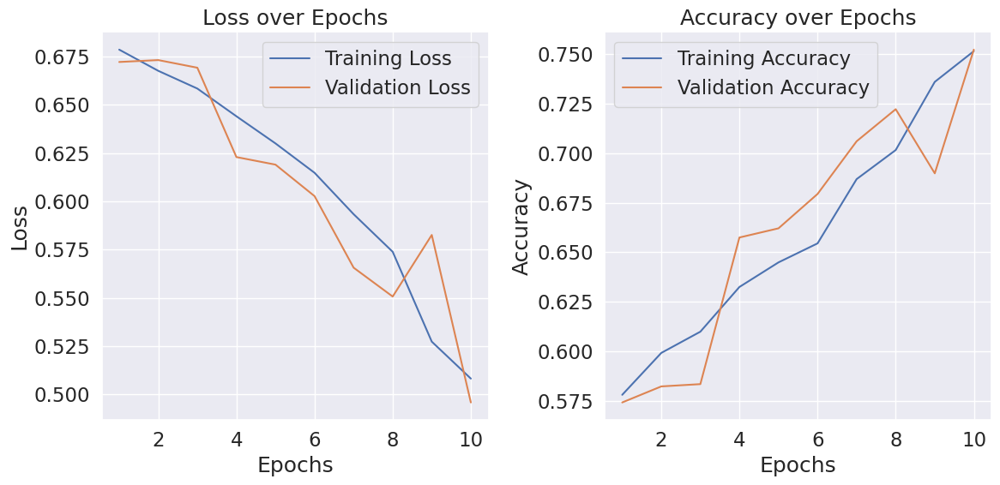

Fold 1 - Test Accuracy: 0.5962

Training Fold 2/5
Epoch 1/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.6917 - loss: 0.5888 - val_accuracy: 0.7454 - val_loss: 0.5062
Epoch 2/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.7404 - loss: 0.5200 - val_accuracy: 0.7338 - val_loss: 0.5205
Epoch 3/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.7527 - loss: 0.5008 - val_accuracy: 0.7870 - val_loss: 0.4328
Epoch 4/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.7666 - loss: 0.4635 - val_accuracy: 0.8102 - val_loss: 0.4053
Epoch 5/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.8277 - loss: 0.4015 - val_accuracy: 0.8507 - val_loss: 0.3353
Epoch 6/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.8370 - loss: 0.3606 - val_accuracy: 0.8380 - val_loss: 0.3756
Epoch 7/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.8459 - loss: 0.3432 - val_accuracy: 0.8704 - val_loss: 0.3100
Epoch 8/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s

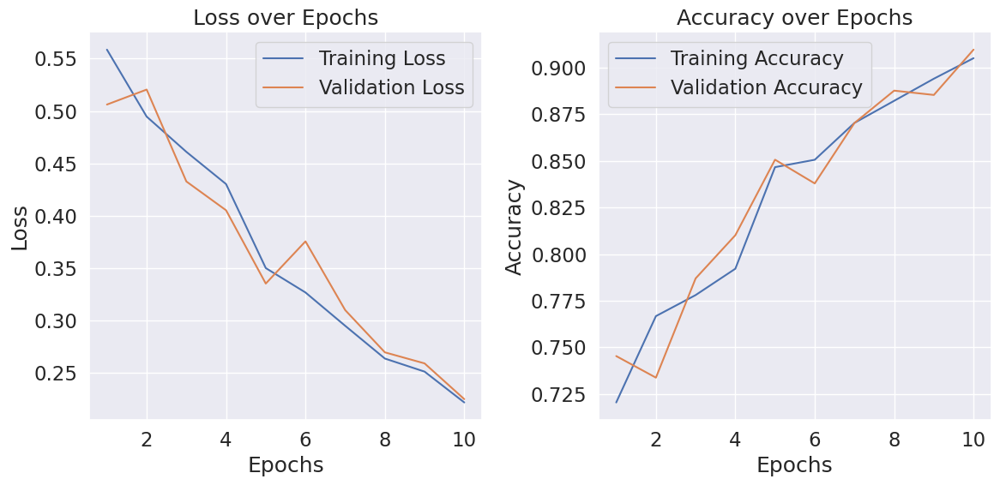

Fold 2 - Test Accuracy: 0.6933

Training Fold 3/5
Epoch 1/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.8412 - loss: 0.3847 - val_accuracy: 0.8785 - val_loss: 0.2986
Epoch 2/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.8785 - loss: 0.2861 - val_accuracy: 0.9005 - val_loss: 0.2426
Epoch 3/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - accuracy: 0.9029 - loss: 0.2343 - val_accuracy: 0.9120 - val_loss: 0.2268
Epoch 3: early stopping
Restoring model weights from the end of the best epoch: 1.


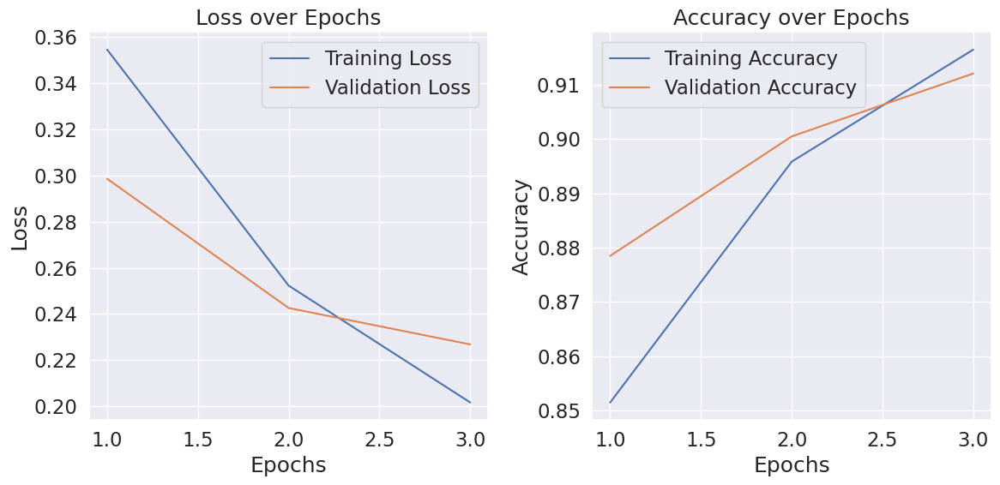

Fold 3 - Test Accuracy: 0.8784

Training Fold 4/5
Epoch 1/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.8664 - loss: 0.3035 - val_accuracy: 0.9039 - val_loss: 0.2123
Epoch 2/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.9055 - loss: 0.2303 - val_accuracy: 0.8414 - val_loss: 0.3960
Epoch 3/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.8473 - loss: 0.3542 - val_accuracy: 0.9213 - val_loss: 0.1914
Epoch 4/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.9104 - loss: 0.2185 - val_accuracy: 0.9456 - val_loss: 0.1552
Epoch 5/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.9325 - loss: 0.1782 - val_accuracy: 0.9433 - val_loss: 0.1195
Epoch 6/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.9390 - loss: 0.1468 - val_accuracy: 0.9282 - val_loss: 0.1813
Epoch 7/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.9260 - loss: 0.1920 - val_accuracy: 0.9421 - val_loss: 0.1437
Epoch 8/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 133s 1s

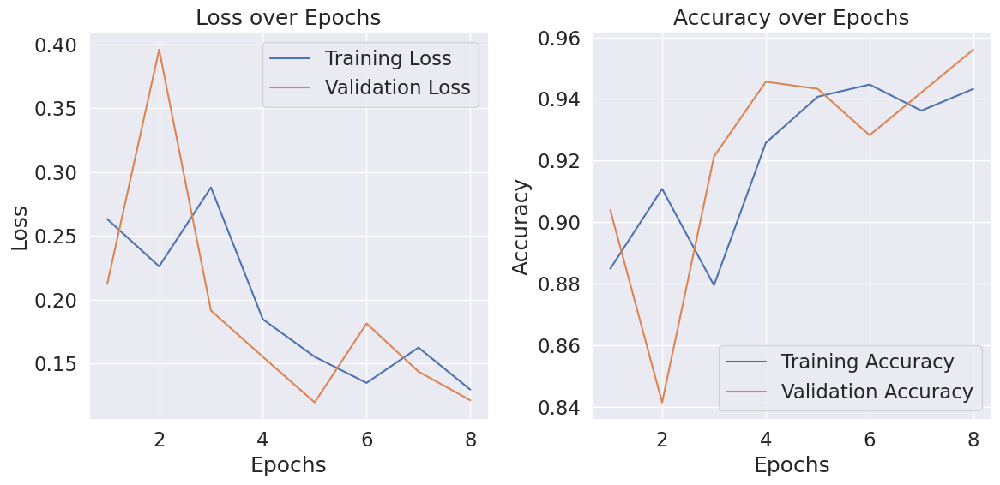

Fold 4 - Test Accuracy: 0.8474

Training Fold 5/5
Epoch 1/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - accuracy: 0.9092 - loss: 0.2432 - val_accuracy: 0.9236 - val_loss: 0.2056
Epoch 2/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - accuracy: 0.9084 - loss: 0.2125 - val_accuracy: 0.9398 - val_loss: 0.1581
Epoch 3/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - accuracy: 0.9453 - loss: 0.1511 - val_accuracy: 0.9444 - val_loss: 0.1392
Epoch 3: early stopping
Restoring model weights from the end of the best epoch: 1.


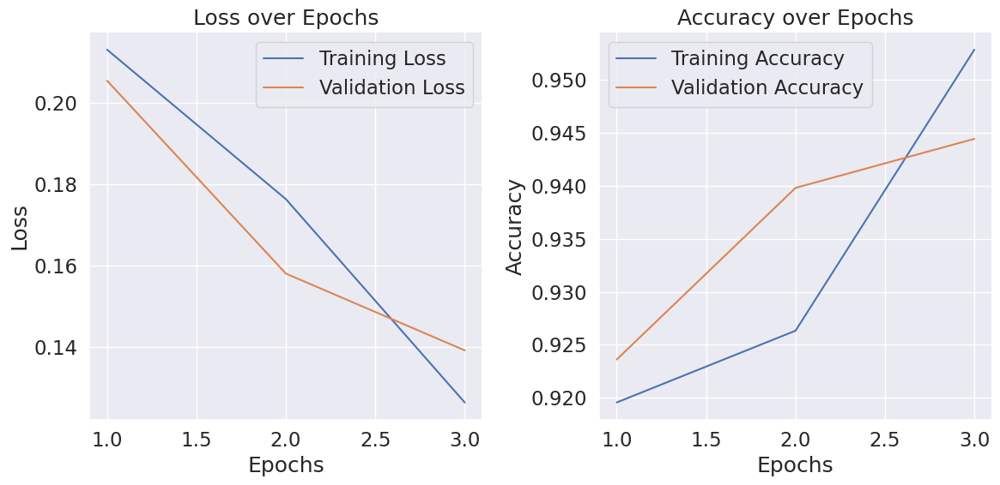

Fold 5 - Test Accuracy: 0.9319


In [42]:
# Hyperparameters
epochs = 10

# Loop through each fold
for fold_idx, (train_dataset, test_dataset) in enumerate(fold_datasets):
    print(f"\nTraining Fold {fold_idx + 1}/{len(fold_datasets)}")
    
    # Split train_dataset into train and validation datasets
    validation_split = 0.2  # 20% for validation
    total_train_size = len(train_dataset)
    val_size = int(total_train_size * validation_split)
    
    train_dataset = train_dataset.skip(val_size)
    val_dataset = train_dataset.take(val_size)
    
    # Train the model
    training = model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=epochs,
        callbacks=[ckpt_cb, erst_cb],
        verbose=CFG.verbose,
    )

    # Extract loss and accuracy values from the history object
    train_loss = training.history['loss']
    val_loss = training.history['val_loss']
    train_acc = training.history['accuracy']
    val_acc = training.history['val_accuracy']
    
    # Plotting the training and validation loss
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')
    plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    # Plotting the training and validation accuracy
    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(train_acc) + 1), train_acc, label='Training Accuracy')
    plt.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Display the plots
    plt.tight_layout()
    plt.show()
    
    # Evaluate on the testing dataset
    test_loss, test_accuracy = model.evaluate(test_dataset, verbose=0)
    print(f"Fold {fold_idx + 1} - Test Accuracy: {test_accuracy:.4f}")

<h1 style="font-family: 'Arial', sans-serif; color: #FF5722; text-align: center;">
    📊 Model Evaluation, Metrics & Final Model Saving 🔒
</h1>

<p style="font-family: 'Verdana', sans-serif; color: #333333; font-size: 18px; text-align: center;">
    This section is dedicated to evaluating the model's performance on the test set across all folds. We compute important classification metrics and visualize the results with a confusion matrix.
</p>

<ul style="font-family: 'Courier New', monospace; font-size: 16px; color: #333333;">
    <li>📈 <strong>Model Evaluation:</strong> Evaluate the model's performance on the test dataset across all folds, collecting true and predicted labels for analysis.</li>
    <li>🔢 <strong>Confusion Matrix:</strong> Visualize the confusion matrix to assess the performance of the model in terms of true positives, false positives, true negatives, and false negatives.</li>
    <li>💡 <strong>Performance Metrics:</strong> Calculate key metrics like Precision, Sensitivity, Specificity, and Mean Accuracy to better understand model performance on seizure detection.</li>
    <li>💾 <strong>Model Saving:</strong> Save the trained model as "cnn_lstm.keras" for future use.</li>
</ul>

<p style="font-family: 'Arial', sans-serif; color: #8E24AA; font-size: 16px;">
    These evaluations and metrics provide an overview of the model's ability to classify seizure events accurately. The model is then saved for further deployment and analysis. 🧠💾
</p>

In [43]:
# Collect true and predicted labels for the test set across all folds
y_true_all = []
y_pred_all = []

print("Evaluation Running...")

# Loop through each fold's test dataset
for fold_idx, (train_dataset, test_dataset) in enumerate(fold_datasets):
    print(f"\nEvaluating Fold {fold_idx + 1}/{len(fold_datasets)}")
    
    y_true = []
    y_pred = []
    
    for eeg_data, labels in test_dataset:
        predictions = model.predict(eeg_data, verbose=0)
        y_true.extend(labels.numpy())
        y_pred.extend(tf.argmax(predictions, axis=1).numpy())
    
    # Append results for all folds
    y_true_all.extend(y_true)
    y_pred_all.extend(y_pred)

print("Evaluation Ends!")


Evaluation Running...

Evaluating Fold 1/5

Evaluating Fold 2/5

Evaluating Fold 3/5

Evaluating Fold 4/5

Evaluating Fold 5/5
Evaluation Ends!


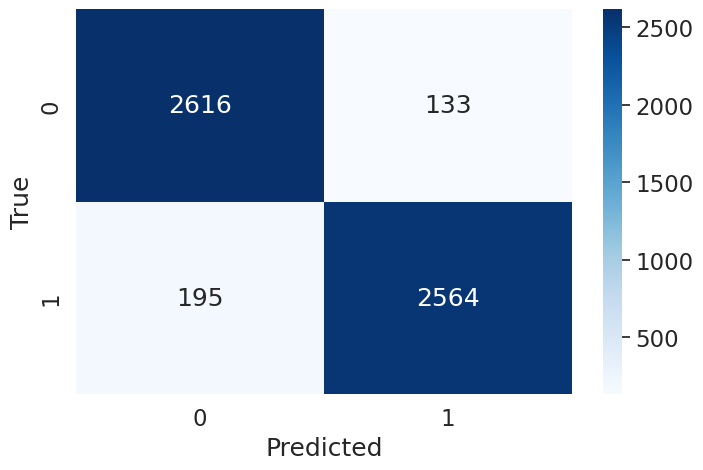

Model Precision: 95.0%
Model Sensitivity: 93.0%
Model Specificity: 95.0%
Model Mean Accuracy: 94.0%

			CLASSIFICATION REPORT:
              precision    recall  f1-score   support

 Non-Seizure       0.93      0.95      0.94      2749
     Seizure       0.95      0.93      0.94      2759

    accuracy                           0.94      5508
   macro avg       0.94      0.94      0.94      5508
weighted avg       0.94      0.94      0.94      5508



In [82]:
cm = confusion_matrix(y_true_all, y_pred_all)
# Plot confusion matrix heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Print the average accuracy & specificity model acheived
TN, FP, FN, TP = cm.ravel()
precision = TP / (TP + FP)
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
acc = accuracy_score(y_true_all, y_pred_all)
print(f"\033[1mModel Precision: {round(precision, 2) * 100}%\033[0m")
print(f"\033[1mModel Sensitivity: {round(sensitivity, 2) * 100}%\033[0m")
print(f"\033[1mModel Specificity: {round(specificity, 2) * 100}%\033[0m")
print(f"\033[1mModel Mean Accuracy: {round(acc, 2) * 100}%\n\033[0m")

# Generate a classification report
print("\t\t\tCLASSIFICATION REPORT:")
print(classification_report(y_true_all, y_pred_all, target_names=["Non-Seizure", "Seizure"]))


In [ ]:
model.save("cnn_lstm.keras")